<p style="font-size:32px;text-align:center"><b><font color=DarkMagenta>Amazon Apparel Recommendations</font></b></p>
<p style="font-size:20px;text-align:center"><b><font color=DarkGoldenRod>Part 2</font></b></p>

<h3><font color=MediumVioletRed>Loading Data</font></h3>

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
os.chdir("D:/Amazon Apparel Recommendation Engine")

In [3]:
import pandas as pd
import pickle
#read the data from pickle file as we saved at the end of part1
apparel_data = pd.read_pickle("Saved Files/16k_Products_Data")

<h3><font color=MediumVioletRed>Text Pre-Processing</font></h3>

In [4]:
import math
import time
import numpy as np

import nltk
import re
from nltk.corpus import stopwords

In [8]:
#we use the list of stop words that are downloaded from nltk lib
stop_words = set(stopwords.words('english'))

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            #remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            
            #conver all letters to lower-case
            word = word.lower()
            
            #stop-word removal
            if not word in stop_words:
                string += word + " "
        apparel_data[column][index] = string

In [9]:
start_time = time.clock()
#we take each title and we text-preprocess it

for index, row in apparel_data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
    
#we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "Sec")

3.8902280000000005 Sec


In [10]:
apparel_data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [11]:
#save the data
apparel_data.to_pickle("Saved Files/16k_Prep_Products_Data") #pre_processed data

<p style="font-size:22px;text-align:center"><b><font color=Turquoise>Text Based Product Similarity</font></b></p>

In [13]:
#read the data from pickle file as we saved in previous stage
apparel_data = pd.read_pickle("Saved Files/16k_Prep_Products_Data")

apparel_data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


<p style="font-size:15px"><b><font color=SaddleBrown>Utility Functions</font></b></p>

In [22]:
#utility functions which we will use through the rest of the case_study
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from collections import Counter
from PIL import Image
import requests
from io import BytesIO

#display an image
def display_img(url,ax,fig):
    #we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    #we will display it in notebook 
    plt.imshow(img)
    
#plotting code to understand the algorithm's decision
def plot_heatmap(keys, values, labels, url, text):
        #keys: list of words of recommended title
        #values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        #labels: len(labels) == len(keys), the values of labels depends on the model we are using
                #if model == 'bag of words': labels(i) = values(i)
                #if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                #if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        #url : apparel's url

        #we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        #1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        #it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) #set that axis labels as the words of title
        ax.set_title(text) #apparel title
        
        #2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        #we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        #we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        #displays combine figure ( heat map and image together)
        plt.show()
    

def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):
    #doc_id : index of the title1
    #vec1 : input apparels's vector, it is of a dict type {word:count}
    #vec2 : recommended apparels's vector, it is of a dict type {word:count}
    #url : apparels image url
    #text: title of recomonded apparel (used to keep title of image)
    #model, it can be any of the models, 
        #1. bag_of_words
        #2. tfidf
        #3. idf

    #we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    #we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    #for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    #labels: len(labels) == len(keys), the values of labels depends on the model we are using
        #if model == 'bag of words': labels(i) = values(i)
        #if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        #if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            #tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            #tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            #idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            #idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


#this function gets a list of wrods along with the frequency of each 
#word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    #words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}


def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    #vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    #vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

<p style="font-size:15px"><b><font color=Crimson>1. Bag of Words (BoW) Based Product Similarity</font></b></p>

In [16]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(apparel_data['title'])
title_features.get_shape() #get number of rows and columns in feature matrix

#title_features.shape = #data_points * #words_in_corpus
#CountVectorizer().fit_transform(corpus) returns 
#the a sparase matrix of dimensions #data_points * #words_in_corpus

#What is a sparse vector?
#title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16042, 12609)

In [26]:
from sklearn.metrics import pairwise_distances

def bag_of_words_model(doc_id, num_results):
    
    #doc_id: apparel's id in given corpus
    #pairwise_dist will store the distance from given input apparel to all remaining apparels
    #the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    
    #ref: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    #np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],apparel_data['title'].loc[df_indices[0]], apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:', apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Similarity With The Query Image:', pdists[i])
        print('-.'*60)

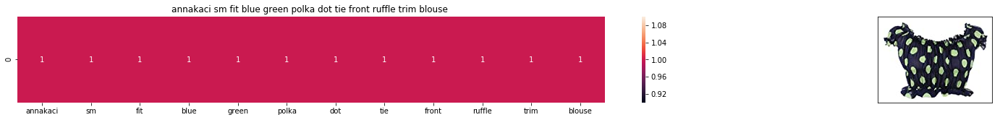

ASIN : B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Similarity With The Query Image : 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


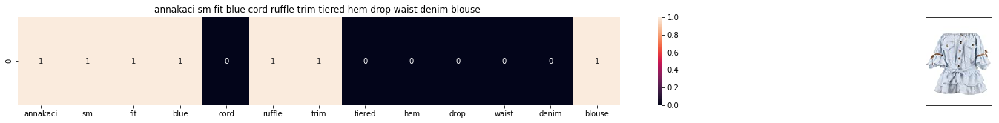

ASIN : B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean Similarity With The Query Image : 3.3166247903554
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


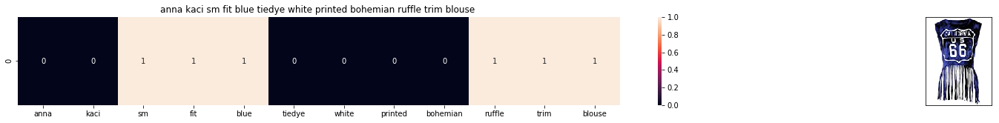

ASIN : B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


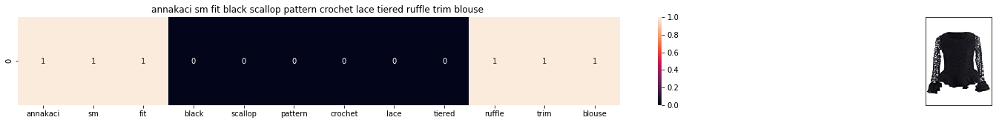

ASIN : B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


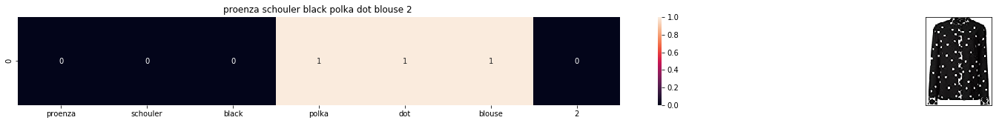

ASIN : B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


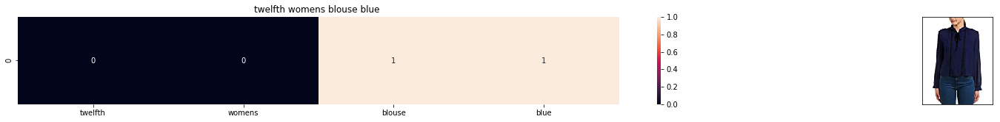

ASIN : B074F5BP5F
Brand: On Twelfth
Title: twelfth womens blouse blue 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


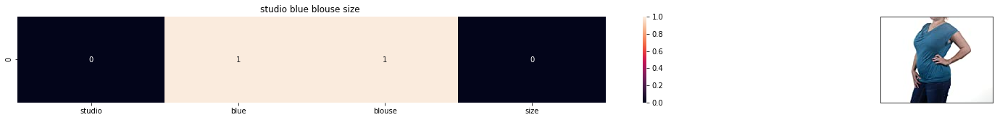

ASIN : B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


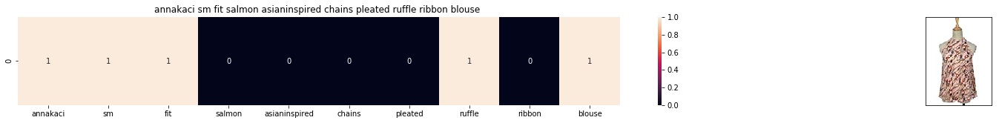

ASIN : B007KSG42S
Brand: Anna-Kaci
Title: annakaci sm fit salmon asianinspired chains pleated ruffle ribbon blouse 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


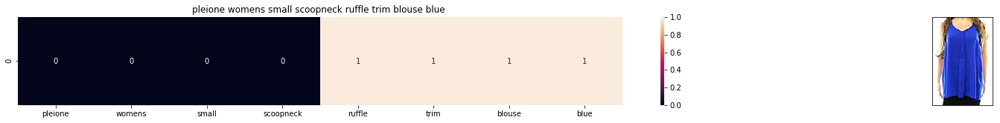

ASIN : B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean Similarity With The Query Image : 3.4641016151377544
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


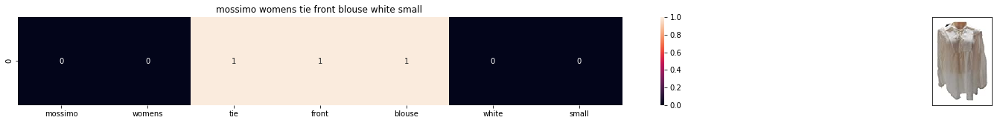

ASIN : B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


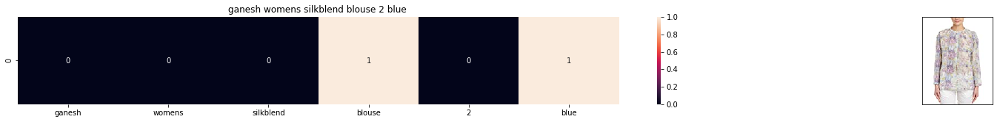

ASIN : B01N3SAT1F
Brand: Ganesh
Title: ganesh womens silkblend blouse 2 blue 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


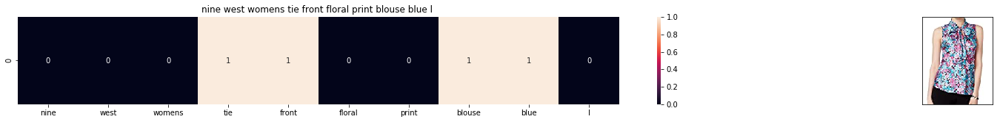

ASIN : B06WW5C6NJ
Brand: Nine West
Title: nine west womens tie front floral print blouse blue l 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


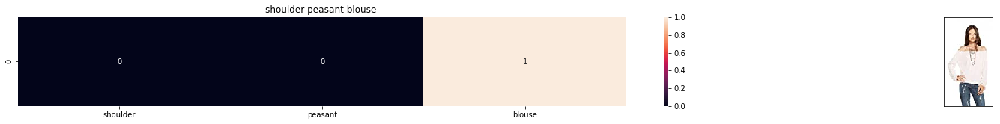

ASIN : B01E1QD5PK
Brand: CHASER
Title: shoulder peasant blouse 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


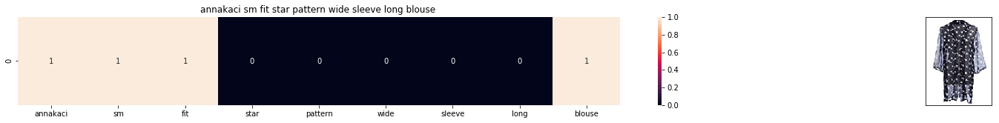

ASIN : B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


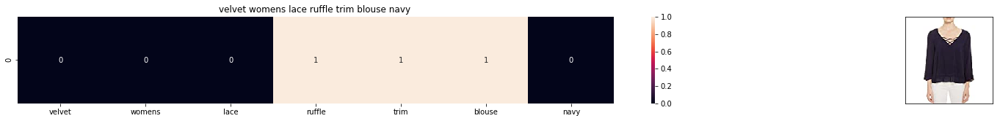

ASIN : B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


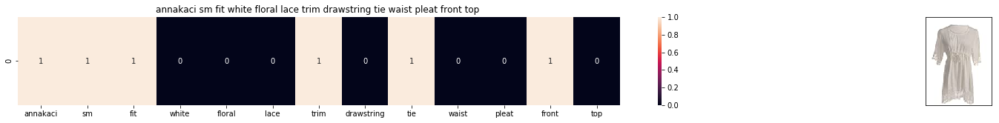

ASIN : B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


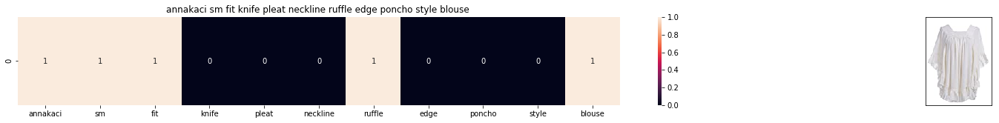

ASIN : B00HCNNOJW
Brand: Anna-Kaci
Title: annakaci sm fit knife pleat neckline ruffle edge poncho style blouse 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


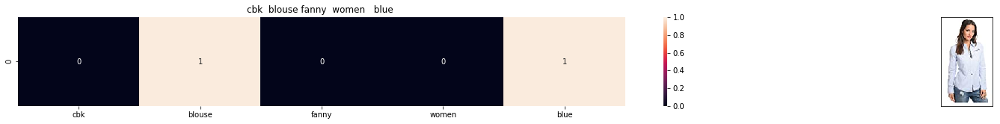

ASIN : B071NDX99J
Brand: CBK
Title: cbk  blouse fanny  women   blue 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


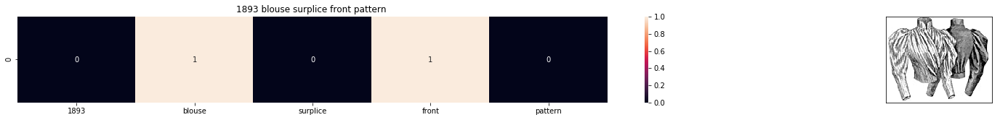

ASIN : B00886YXL0
Brand: Ageless Patterns
Title: 1893 blouse surplice front pattern 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


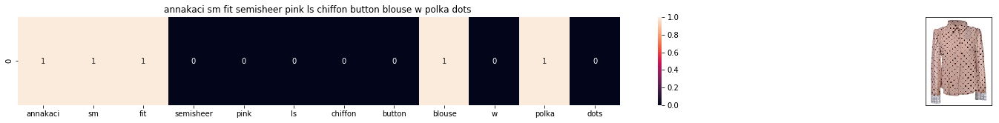

ASIN : B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean Similarity With The Query Image : 3.605551275463989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [49]:
#call the bag-of-words model for a product to get similar products
bag_of_words_model(931, 20) #change the index if you want to

#in the output heat map each value represents the count value of the label word, 
#the color represents the intersection with inputs title

<p style="font-size:15px"><b><font color=Crimson>2. TF IDF Based Product Similarity</font></b></p>

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(apparel_data['title'])
tfidf_title_features.get_shape() #get number of rows and columns in feature matrix

#tfidf_title_features.shape = #data_points * #words_in_corpus
#CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
#tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

In [52]:
def tfidf_model(doc_id, num_results):
    #doc_id: apparel's id in given corpus
    #pairwise_dist will store the distance from given input apparel to all remaining apparels
    #the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    
    #ref: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    #np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])

    for i in range(0,len(indices)):
        #we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], apparel_data['title'].loc[df_indices[0]], apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:',apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Similarity With The Query Image:', pdists[i])
        print('-.'*60)

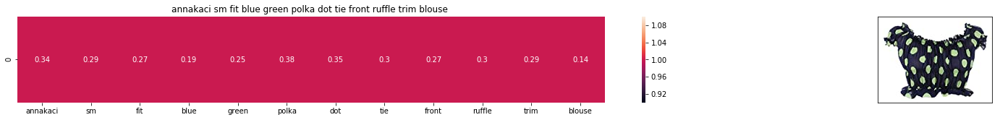

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Similarity With The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


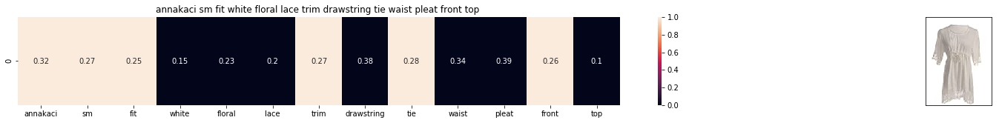

ASIN: B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean Similarity With The Query Image: 1.0095030470167985
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


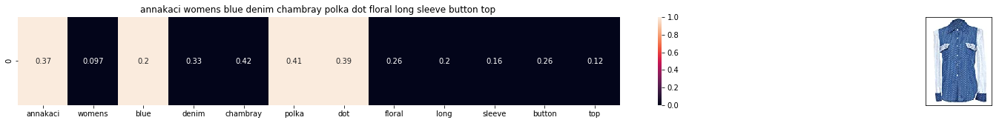

ASIN: B008SMIFN6
Brand: Anna-Kaci
Title: annakaci womens blue denim chambray polka dot floral long sleeve button top 
Euclidean Similarity With The Query Image: 1.0417985120306879
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


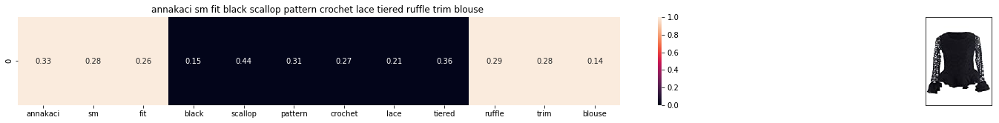

ASIN: B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean Similarity With The Query Image: 1.0459904789057266
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


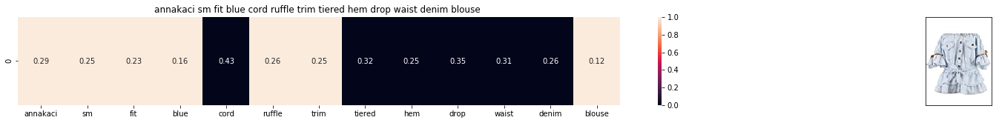

ASIN: B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean Similarity With The Query Image: 1.0670382891349646
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


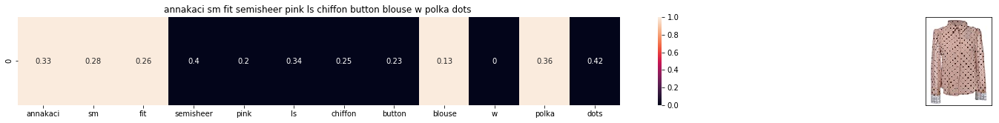

ASIN: B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean Similarity With The Query Image: 1.0791943428312727
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


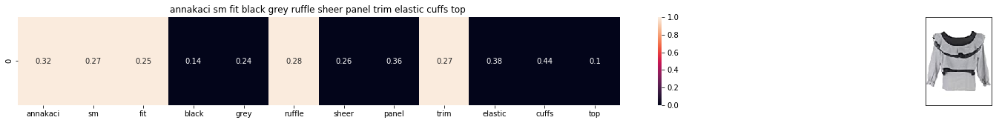

ASIN: B00OIBU11K
Brand: Anna-Kaci
Title: annakaci sm fit black grey ruffle sheer panel trim elastic cuffs top 
Euclidean Similarity With The Query Image: 1.0810642547494655
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


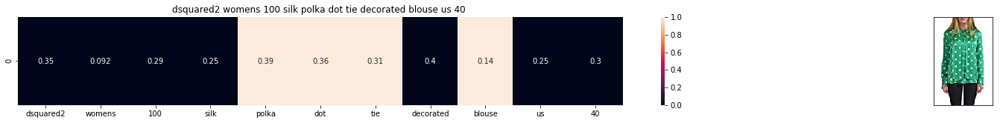

ASIN: B01AYBH28M
Brand: DSQUARED2
Title: dsquared2 womens 100 silk polka dot tie decorated blouse us 40 
Euclidean Similarity With The Query Image: 1.1040520792000037
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


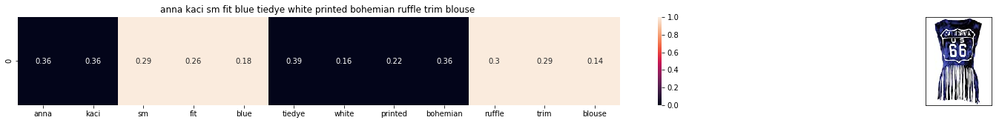

ASIN: B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Similarity With The Query Image: 1.1106318669558235
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


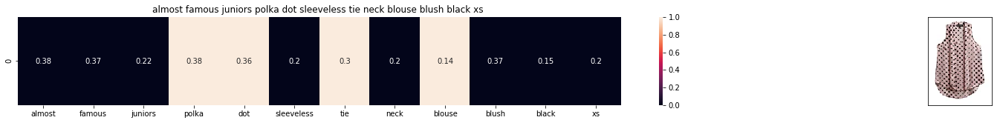

ASIN: B0745J9HNS
Brand: Almost Famous
Title: almost famous juniors polka dot sleeveless tie neck blouse blush black xs 
Euclidean Similarity With The Query Image: 1.1114784382103977
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


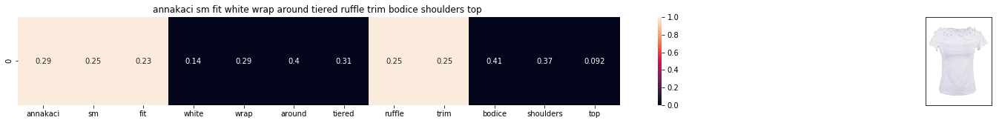

ASIN: B00LMKGFS8
Brand: Anna-Kaci
Title: annakaci sm fit white wrap around tiered ruffle trim bodice shoulders top 
Euclidean Similarity With The Query Image: 1.113963394862801
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


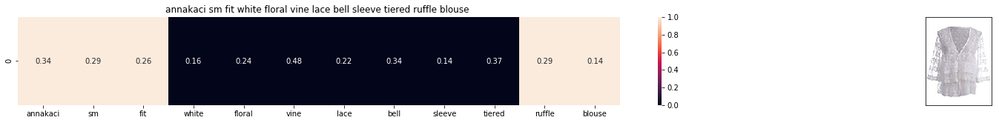

ASIN: B00DVOAWM8
Brand: Anna-Kaci
Title: annakaci sm fit white floral vine lace bell sleeve tiered ruffle blouse 
Euclidean Similarity With The Query Image: 1.115670616192694
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


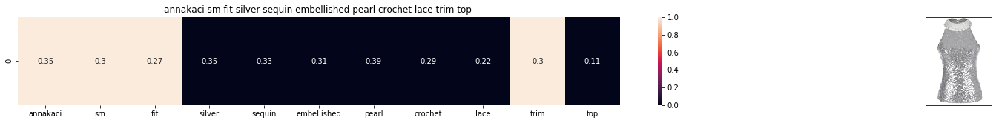

ASIN: B00OPFYBXI
Brand: Anna-Kaci
Title: annakaci sm fit silver sequin embellished pearl crochet lace trim top 
Euclidean Similarity With The Query Image: 1.1246975675554733
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


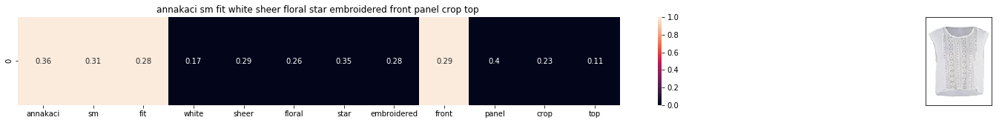

ASIN: B00NAB1R8A
Brand: Anna-Kaci
Title: annakaci sm fit white sheer floral star embroidered front panel crop top 
Euclidean Similarity With The Query Image: 1.124773884923174
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


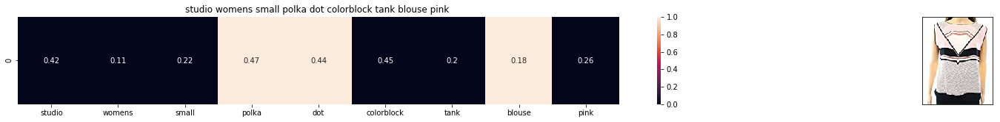

ASIN: B0721KC2HT
Brand: Studio M
Title: studio womens small polka dot colorblock tank blouse pink 
Euclidean Similarity With The Query Image: 1.129816389682597
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


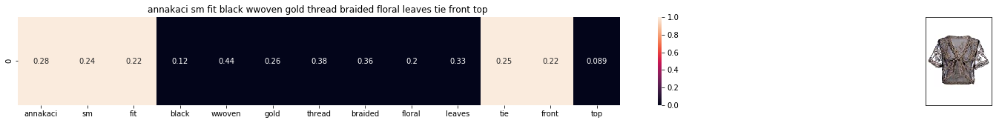

ASIN: B00E7Z8DWQ
Brand: Anna-Kaci
Title: annakaci sm fit black wwoven gold thread braided floral leaves tie front top 
Euclidean Similarity With The Query Image: 1.13146940297404
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


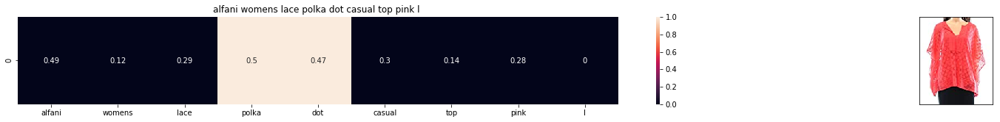

ASIN: B07125NJJ2
Brand: Alfani
Title: alfani womens lace polka dot casual top pink l 
Euclidean Similarity With The Query Image: 1.1325545037426967
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


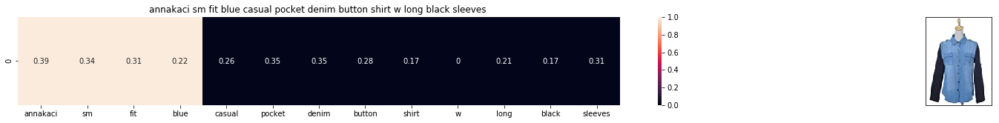

ASIN: B0097LQOOY
Brand: Anna-Kaci
Title: annakaci sm fit blue casual pocket denim button shirt w long black sleeves 
Euclidean Similarity With The Query Image: 1.134493010198643
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


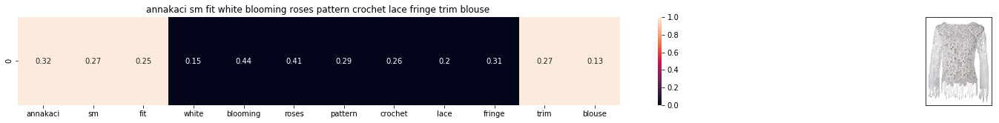

ASIN: B00RDLAR2A
Brand: Anna-Kaci
Title: annakaci sm fit white blooming roses pattern crochet lace fringe trim blouse 
Euclidean Similarity With The Query Image: 1.1394888920467072
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


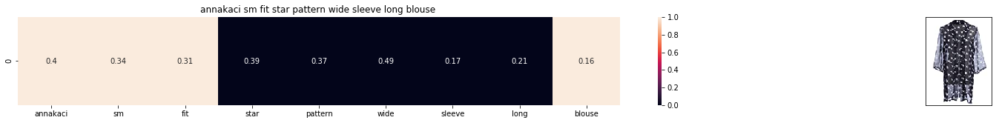

ASIN: B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean Similarity With The Query Image: 1.1474660726278398
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [54]:
#call the tfidf_model for a product to get similar products
tfidf_model(931, 20)
#in the output heat map each value represents the tfidf values of the label word, 
#the color represents the intersection with inputs title

<p style="font-size:15px"><b><font color=Crimson>3. IDF Based Product Similarity</font></b></p>
<p style="font-size:15px">One cache/problem with TF-IDF</p>
- TF is larger for shorter titles because most words do not repeat.
- And If we use whole TF-IDF, then we are going to prefer shorter titles, when we try to get similar items.
- Here In this step, we are going to completely drop TF and just use IDF.
- Offcourse, TFIDF is very very well studied topic in Information Retrieval and Natural Language Processing (NLP),
- But for our use case we are modifying it slightly just to use only IDF. It is just a experiment we are trying out, may or may not work.
- Lets use only IDF as a way to measure similarity

In [56]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(apparel_data['title'])
idf_title_features.get_shape() #get number of rows and columns in feature matrix
# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16042, 12609)

In [57]:
def n_containing(word):
    #return the number of documents which had the given word
    return sum(1 for blob in apparel_data['title'] if word in blob.split())

def idf(word):
    #idf = log(#number of docs / #number of docs which had the given word)
    return math.log(apparel_data.shape[0] / (n_containing(word)))

In [58]:
#we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    #for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    #to calculate idf_title_features we need to replace the count values with the idf values of the word
    #idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        #we replace the count values of word i in document j with  idf_value of word i 
        #idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val

In [59]:
def idf_model(doc_id, num_results):
    #doc_id: apparel's id in given corpus
    #pairwise_dist will store the distance from given input apparel to all remaining apparels
    #the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    
    #ref: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    #np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],apparel_data['title'].loc[df_indices[0]], apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:',apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Distance From The Query Image:', pdists[i])
        print('-.'*60)

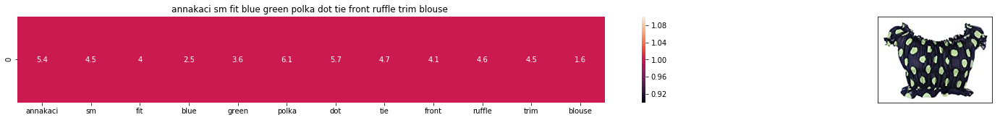

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Similarity With The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


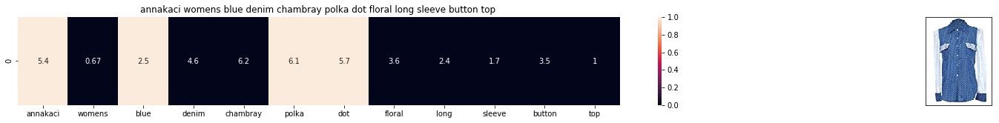

ASIN: B008SMIFN6
Brand: Anna-Kaci
Title: annakaci womens blue denim chambray polka dot floral long sleeve button top 
Euclidean Similarity With The Query Image: 15.046151721911697
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


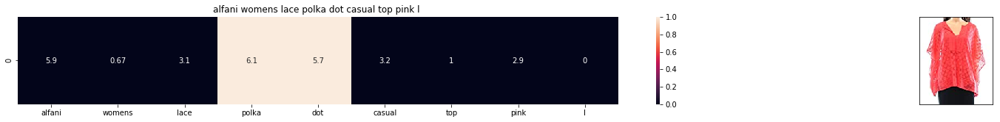

ASIN: B07125NJJ2
Brand: Alfani
Title: alfani womens lace polka dot casual top pink l 
Euclidean Similarity With The Query Image: 15.222769212649535
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


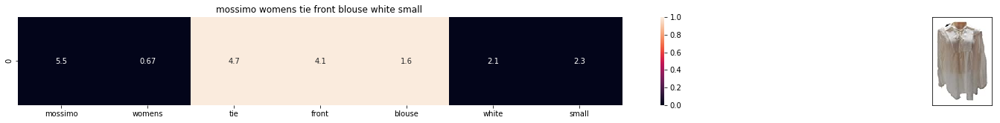

ASIN: B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean Similarity With The Query Image: 15.3415518161122
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


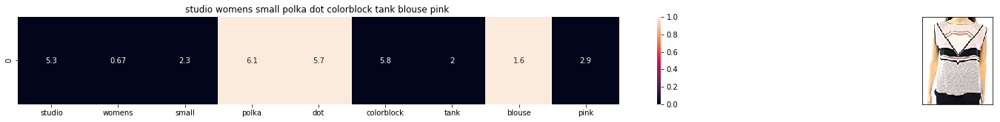

ASIN: B0721KC2HT
Brand: Studio M
Title: studio womens small polka dot colorblock tank blouse pink 
Euclidean Similarity With The Query Image: 15.627349276848992
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


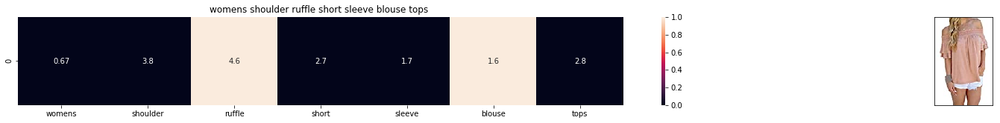

ASIN: B01KXEE20Q
Brand: ouwoow
Title: womens shoulder ruffle short sleeve blouse tops 
Euclidean Similarity With The Query Image: 15.685249209812426
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


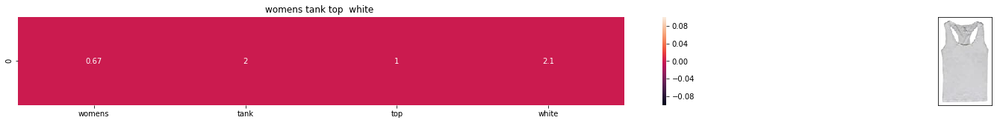

ASIN: B00JPOZ9GM
Brand: Sofra
Title: womens tank top  white 
Euclidean Similarity With The Query Image: 15.698624105009333
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


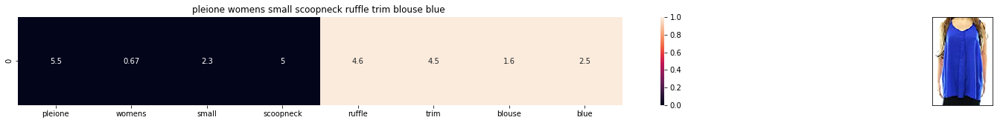

ASIN: B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean Similarity With The Query Image: 15.733159164541727
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


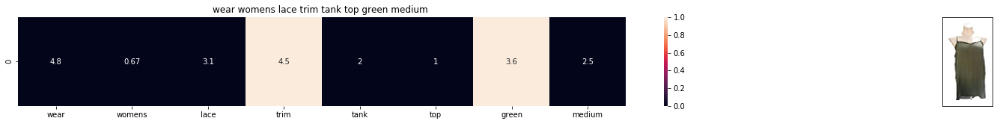

ASIN: B0722TS9DK
Brand: Who What Wear
Title: wear womens lace trim tank top green medium 
Euclidean Similarity With The Query Image: 15.746519642051068
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


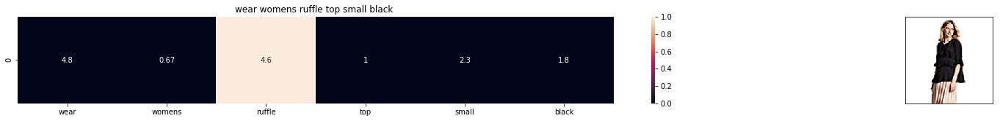

ASIN: B07258X2FK
Brand: Who What Wear
Title: wear womens ruffle top small black 
Euclidean Similarity With The Query Image: 15.76861658770721
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


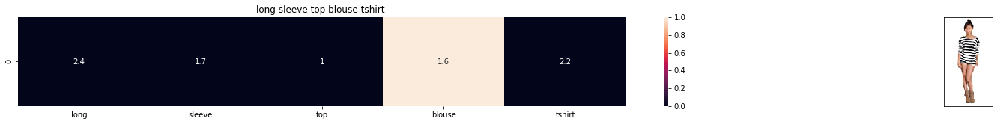

ASIN: B00KF2N5PU
Brand: Vietsbay
Title: long sleeve top blouse tshirt 
Euclidean Similarity With The Query Image: 15.769570727563098
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


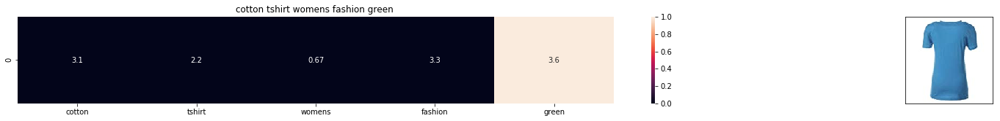

ASIN: B073GJGVBN
Brand: Ivan Levi
Title: cotton tshirt womens fashion green 
Euclidean Similarity With The Query Image: 15.811562821616887
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


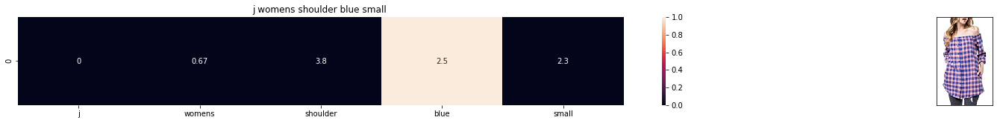

ASIN: B07583CQFT
Brand: Very J
Title: j womens shoulder blue small 
Euclidean Similarity With The Query Image: 15.83828054738109
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


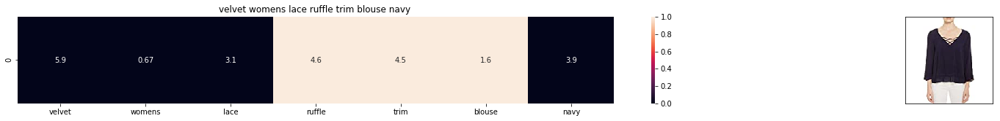

ASIN: B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean Similarity With The Query Image: 15.878781785172018
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


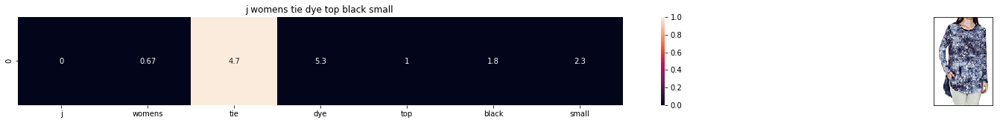

ASIN: B075831F14
Brand: Very J
Title: j womens tie dye top black small 
Euclidean Similarity With The Query Image: 15.928749759426031
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


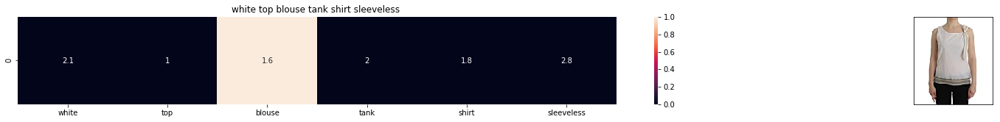

ASIN: B074G5G5RK
Brand: ERMANNO SCERVINO
Title: white top blouse tank shirt sleeveless 
Euclidean Similarity With The Query Image: 15.953279501032116
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


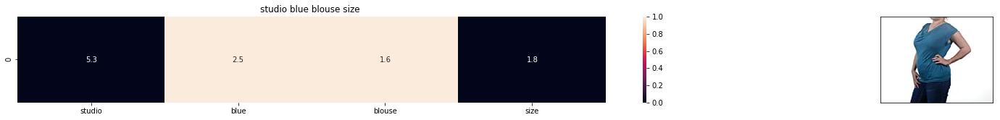

ASIN: B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean Similarity With The Query Image: 16.078823245515473
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


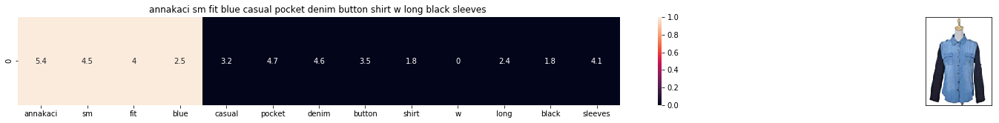

ASIN: B0097LQOOY
Brand: Anna-Kaci
Title: annakaci sm fit blue casual pocket denim button shirt w long black sleeves 
Euclidean Similarity With The Query Image: 16.11978163937991
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


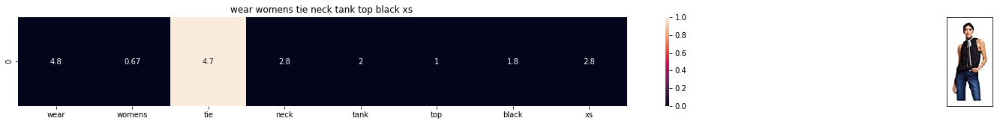

ASIN: B071RYB16J
Brand: Who What Wear
Title: wear womens tie neck tank top black xs 
Euclidean Similarity With The Query Image: 16.18992757930191
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


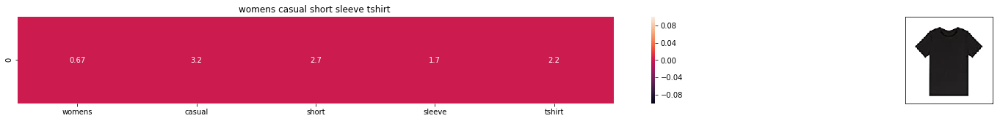

ASIN: B074T9KG9Q
Brand: Rain
Title: womens casual short sleeve tshirt 
Euclidean Similarity With The Query Image: 16.20255923081081
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [60]:
idf_model(931, 20)
#in the output heat map each value represents the idf values of the label word, 
#the color represents the intersection with inputs title

<p style="font-size:22px;text-align:center"><b><font color=Turquoise>Text Semantics Based Product Similarity</font></b></p>

<p style="font-size:15px">
- **BoW and TFIDF both techniques do not account for semantics at all.** **BoW** is simple frequency counter which gives more importance to a word that occurs more aften in a given document and **TFIDF** is also sort of like a frequency counter which gives more importance to a word that occur less often in whole document.
<br><br>
- **Semantic Similarity** or **Semantic Textual Similarity** is a task in the area of Natural Language Processing (NLP) that scores the relationship between texts or documents using a defined metric.
<br><br>
For eg. we know that the words 'tiger' and 'leopard' are related, also 'zebra' and 'strips' related.
<br><br>
- **Word2Vec** is one such very very popolar technique which **learns meaningful relations and encodes the relatedness into vector similarity.**
</p>

In [62]:
#this is the reference/sample code to build your own Word2Vec when you have lots of data
#it is the custom Word2Vec using your own text data

#ref: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors

'''
#set values for various parameters
num_features = 300    #word vector dimensionality                      
min_word_count = 1    #minimum word count                        
num_workers = 4       #number of threads to run in parallel
context = 10          #context window size                                                                                    
downsampling = 1e-3   #downsample setting for frequent words

#initialize and train the model (this will take some time)
from gensim.models import word2vec
print("Training Model...")
model = word2vec.Word2Vec(your_data, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
'''

In [63]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

#in this case_study we are using a pretrained model by google
#its 3.3G file, once we load this into your memory 
#it occupies ~9Gb, so please do this step only if you have >12G of RAM

#to use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
#from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
#it's 1.9GB in size

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

<p style="font-size:15px"><b><font color=SaddleBrown>Utility Functions</font></b></p>

In [64]:
#utility functions

def get_word_vec(sentence, doc_id, m_name):
    #sentence : title of the apparel
    #doc_id: document id in our corpus
    #m_name: model information it will take two values
        #if  m_name == 'avg', we will append the model[i], w2v representation of word i
        #if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
        
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            #if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    #we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    #each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    #vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    #vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    #for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            #np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    #final_dist = np.array(#number of words in title1 * #number of words in title2)
    #final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    #sentance1 : title1, input apparel
    #sentance2 : title2, recommended apparel
    #url: apparel image url
    #doc_id1: document id of input apparel
    #doc_id2: document id of recommended apparel
    #model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    #s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    #s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    #devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    #ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    #set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    #set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    #set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    #we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [65]:
#vocab = stores all the words that are there in google w2v model
#vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
#this function will add the vectors of each word and returns the avg vector of given sentance

def build_avg_vec(sentence, num_features, doc_id, m_name):
    #sentace: its title of the apparel
    #num_features: the lenght of word2vec vector, its values = 300
    #m_name: model information it will take two values
        #if  m_name == 'avg', we will append the model[i], w2v representation of word i
        #if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features), dtype="float32")
    #we will intialize a vector of size 300 with all zeros
    #we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    #returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

<p style="font-size:15px"><b><font color=Crimson>1. Average Word2Vec Based Product Similarity</font></b></p>

In [66]:
doc_id = 0
w2v_title = []
#for every title we build a avg vector representation
for i in apparel_data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

#w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

In [67]:
def avg_w2v_model(doc_id, num_results):
    #doc_id: apparel's id in given corpus
    #dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    #np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(apparel_data['title'].loc[df_indices[0]],apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:',apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Distance From The Query Image:', pdists[i])
        print('-.'*60)

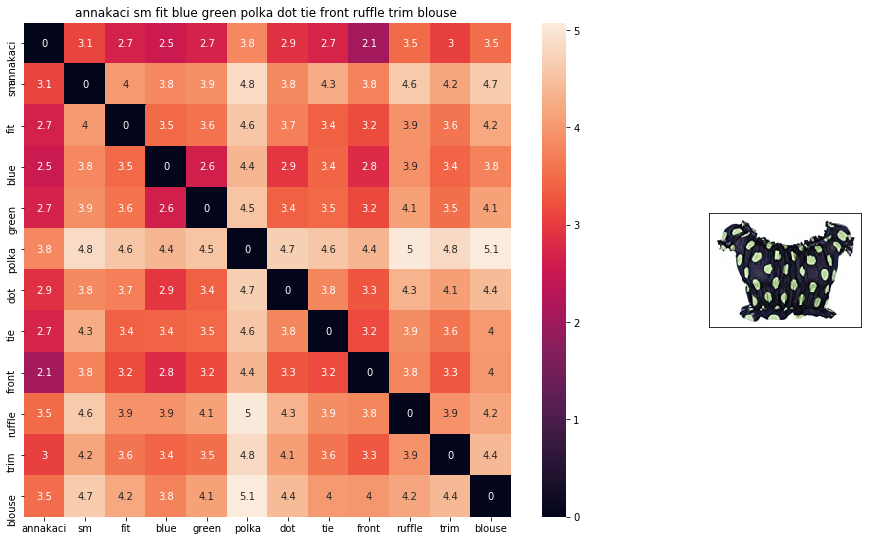

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Similarity With The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


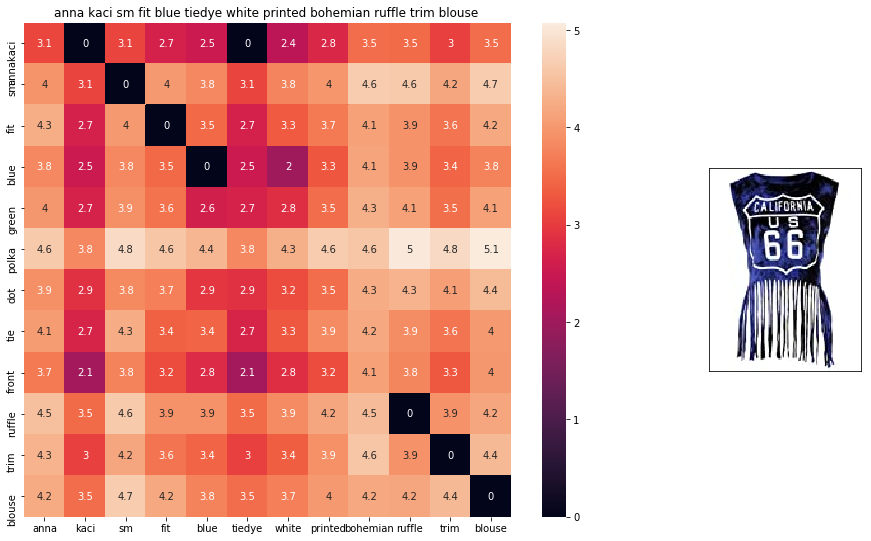

ASIN: B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Similarity With The Query Image: 0.66906893
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


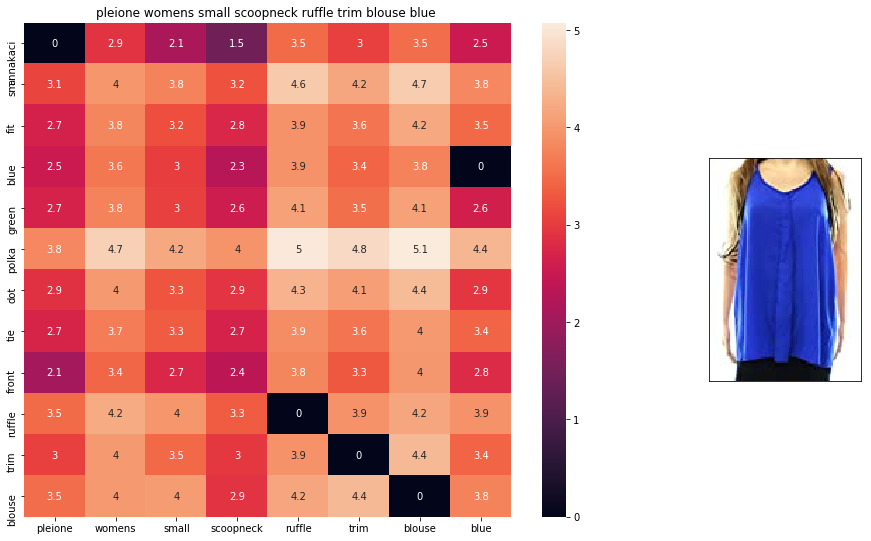

ASIN: B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean Similarity With The Query Image: 0.7917671
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


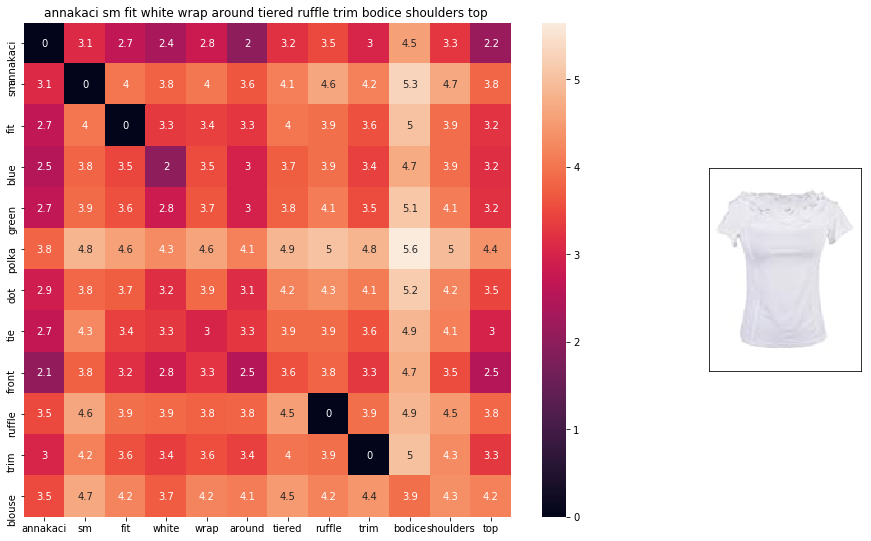

ASIN: B00LMKGFS8
Brand: Anna-Kaci
Title: annakaci sm fit white wrap around tiered ruffle trim bodice shoulders top 
Euclidean Similarity With The Query Image: 0.8094231
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


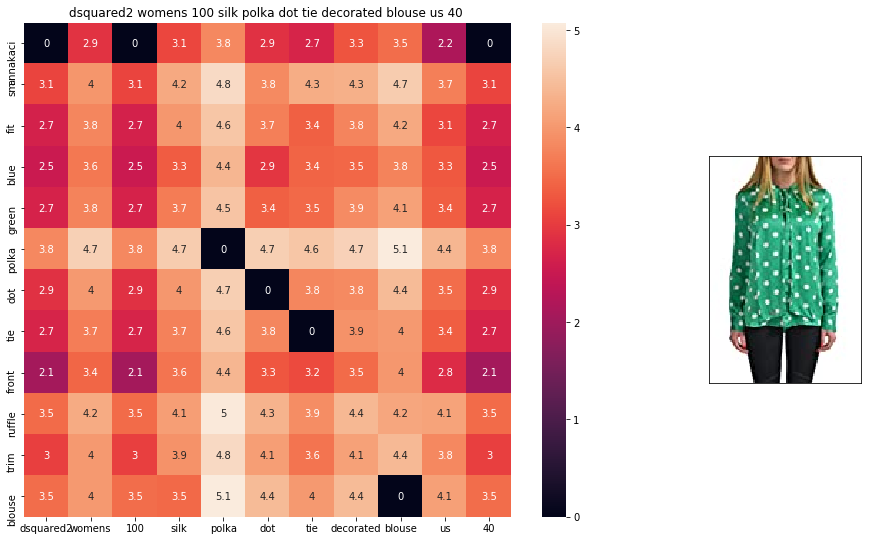

ASIN: B01AYBH28M
Brand: DSQUARED2
Title: dsquared2 womens 100 silk polka dot tie decorated blouse us 40 
Euclidean Similarity With The Query Image: 0.81274205
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


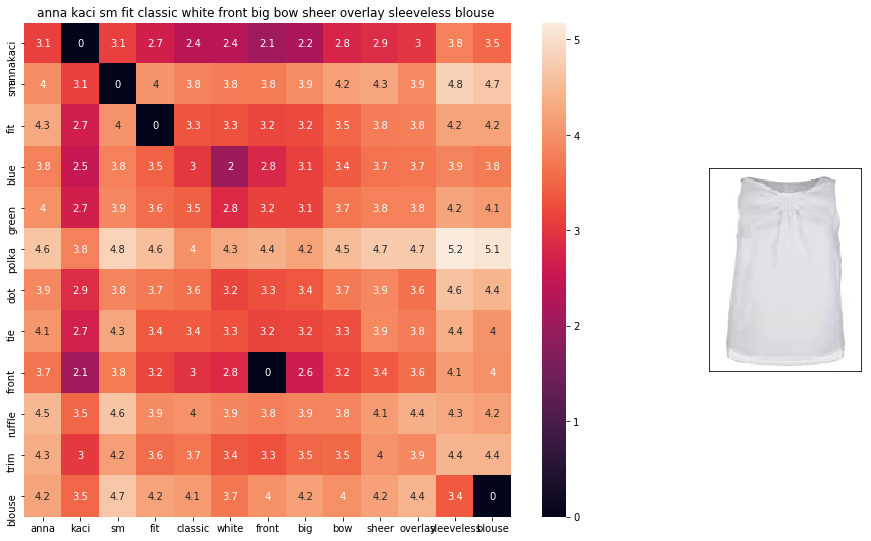

ASIN: B010EH3S02
Brand: Anna-Kaci
Title: anna kaci sm fit classic white front big bow sheer overlay sleeveless blouse 
Euclidean Similarity With The Query Image: 0.81881666
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


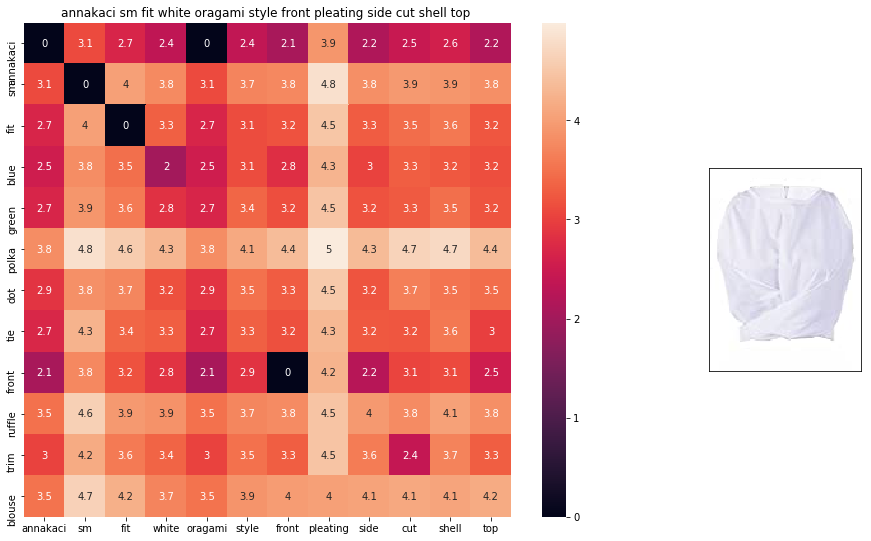

ASIN: B00LU4Z2YY
Brand: Anna-Kaci
Title: annakaci sm fit white oragami style front pleating side cut shell top 
Euclidean Similarity With The Query Image: 0.81900114
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


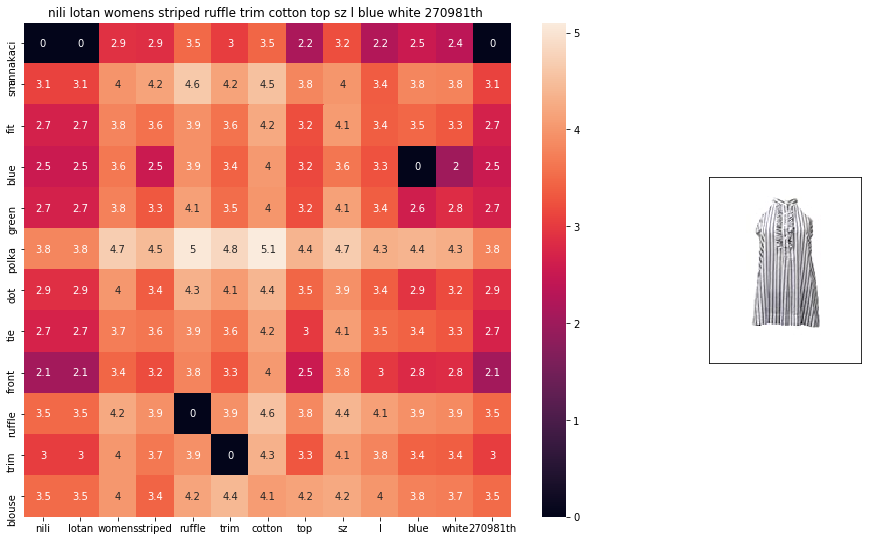

ASIN: B074PFR9CF
Brand: Nili Lotan
Title: nili lotan womens striped ruffle trim cotton top sz l blue white 270981th 
Euclidean Similarity With The Query Image: 0.8217533
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


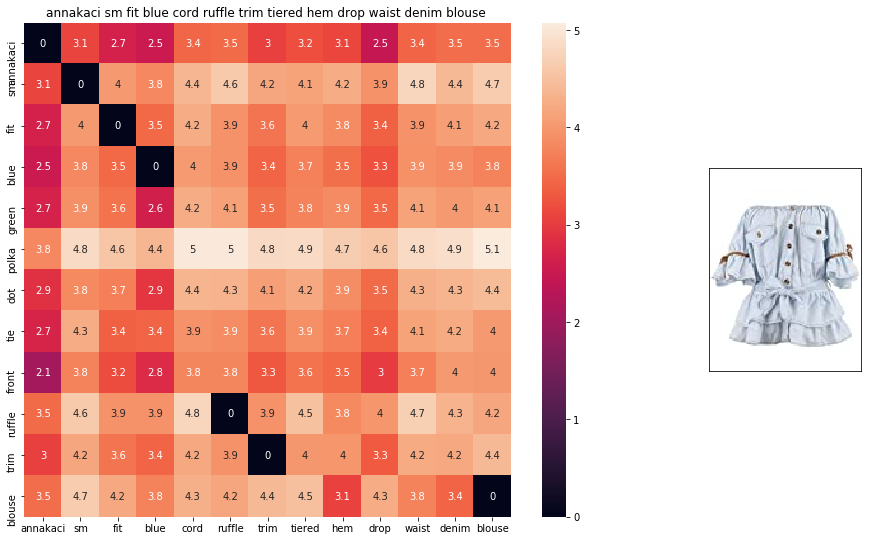

ASIN: B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean Similarity With The Query Image: 0.82678145
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


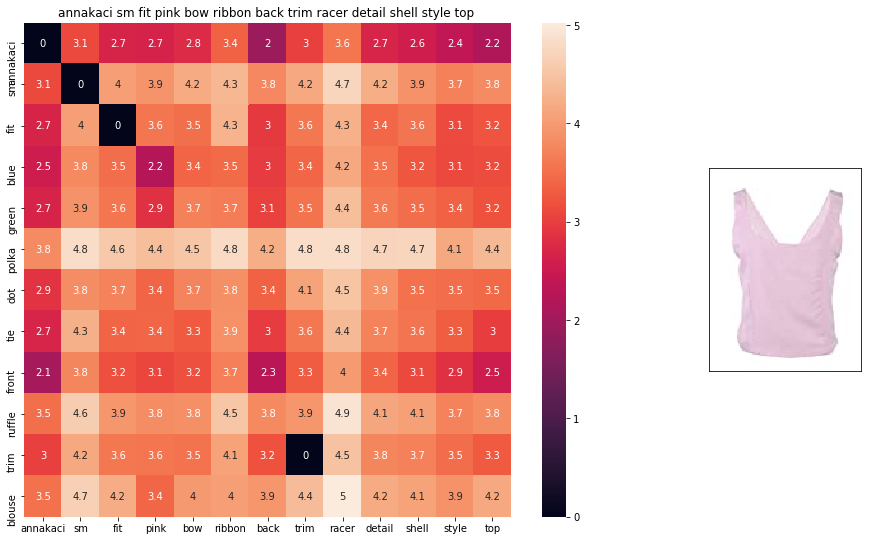

ASIN: B00KOBQEBO
Brand: Anna-Kaci
Title: annakaci sm fit pink bow ribbon back trim racer detail shell style top 
Euclidean Similarity With The Query Image: 0.8268438
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


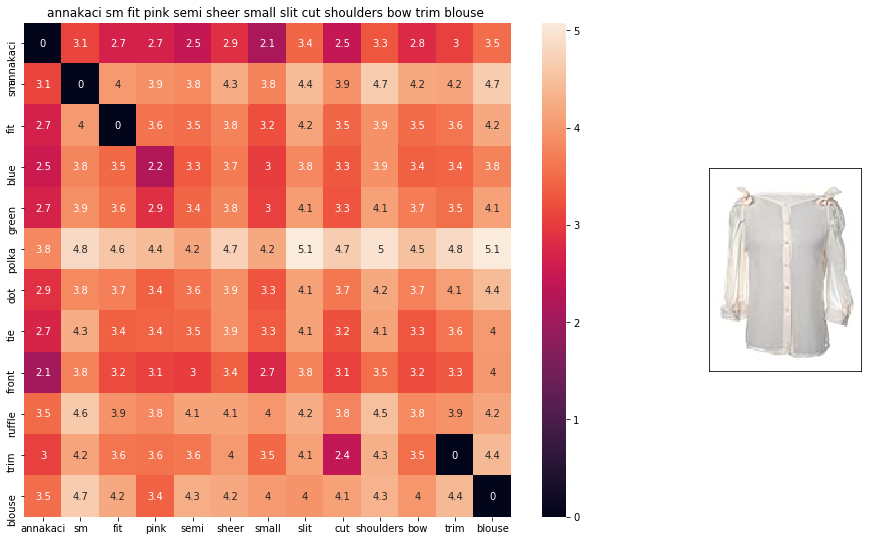

ASIN: B00HM9OD8W
Brand: Anna-Kaci
Title: annakaci sm fit pink semi sheer small slit cut shoulders bow trim blouse 
Euclidean Similarity With The Query Image: 0.82737076
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


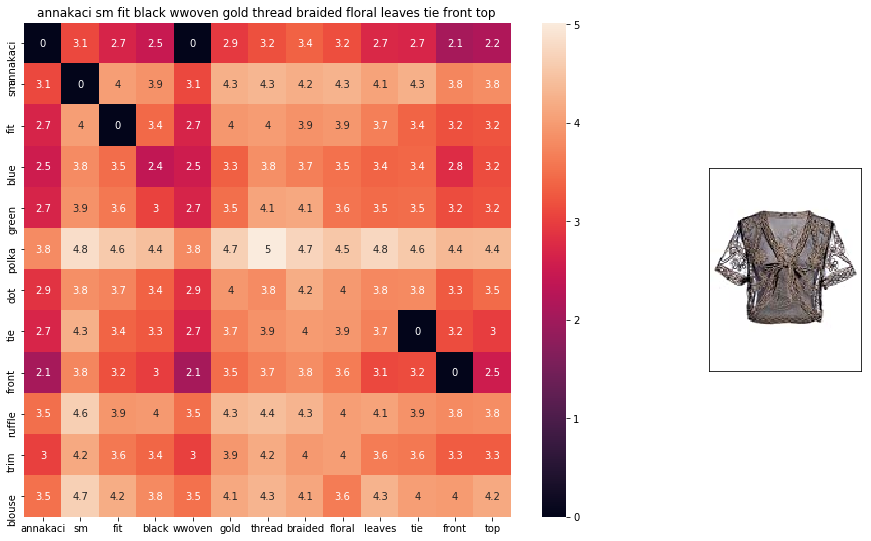

ASIN: B00E7Z8DWQ
Brand: Anna-Kaci
Title: annakaci sm fit black wwoven gold thread braided floral leaves tie front top 
Euclidean Similarity With The Query Image: 0.8279004
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


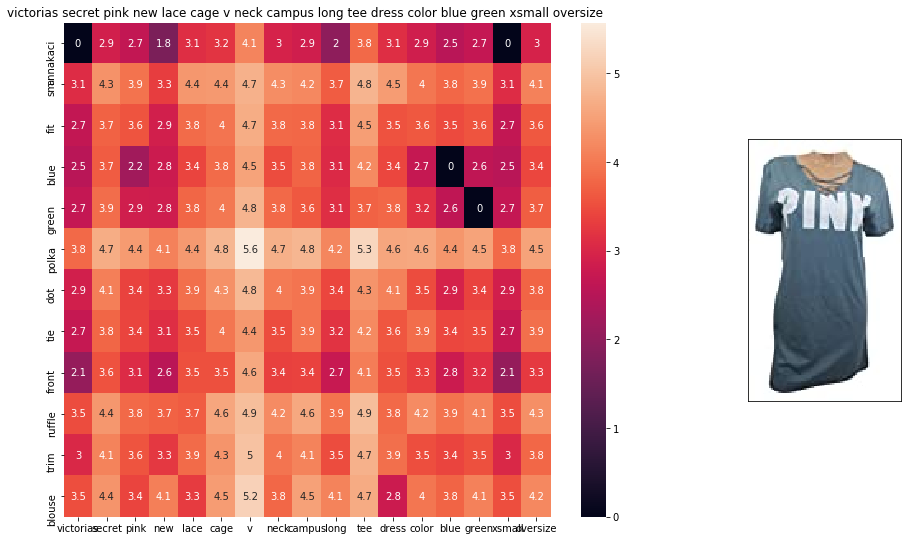

ASIN: B074JKJHNQ
Brand: VS Pink
Title: victorias secret pink new lace cage v neck campus long tee dress color blue green xsmall oversize 
Euclidean Similarity With The Query Image: 0.8330928
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


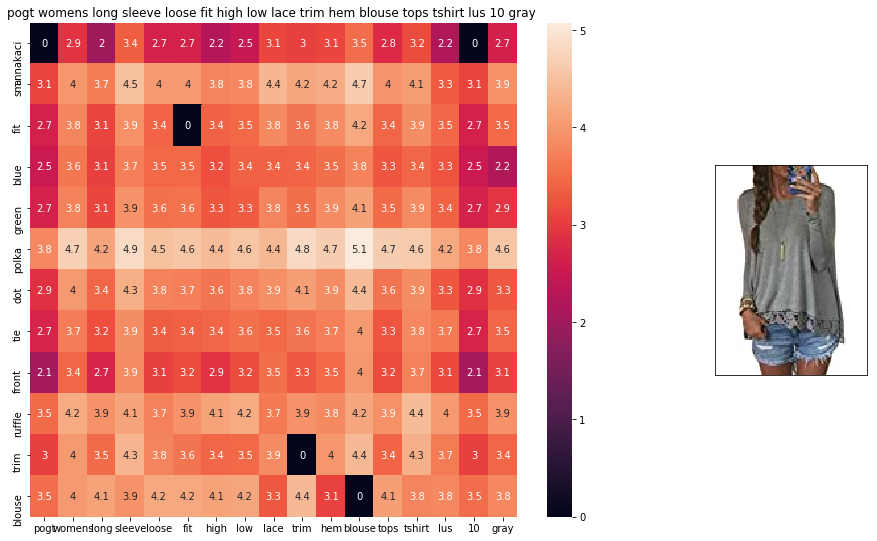

ASIN: B01M19NC0Y
Brand: POGT
Title: pogt womens long sleeve loose fit high low lace trim hem blouse tops tshirt lus 10 gray 
Euclidean Similarity With The Query Image: 0.8357964
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


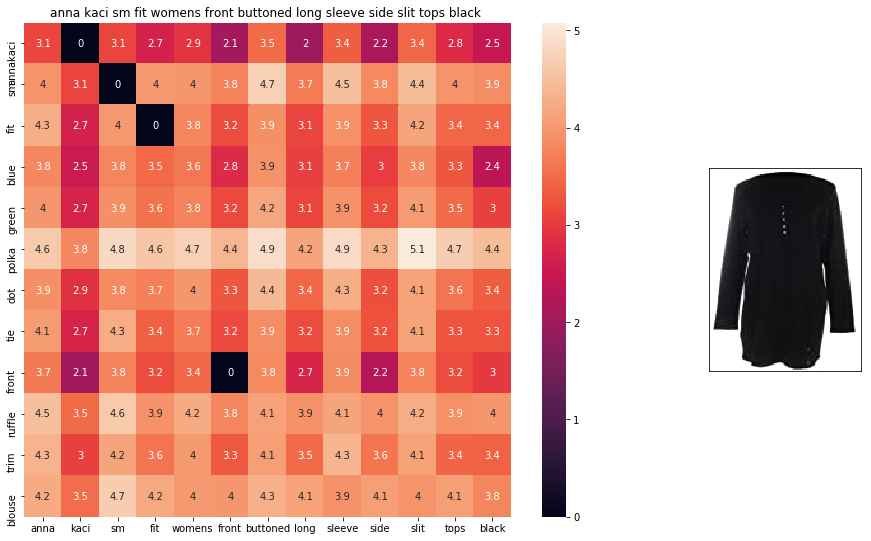

ASIN: B019820A4Q
Brand: Anna-Kaci
Title: anna kaci sm fit womens front buttoned long sleeve side slit tops black 
Euclidean Similarity With The Query Image: 0.84296256
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


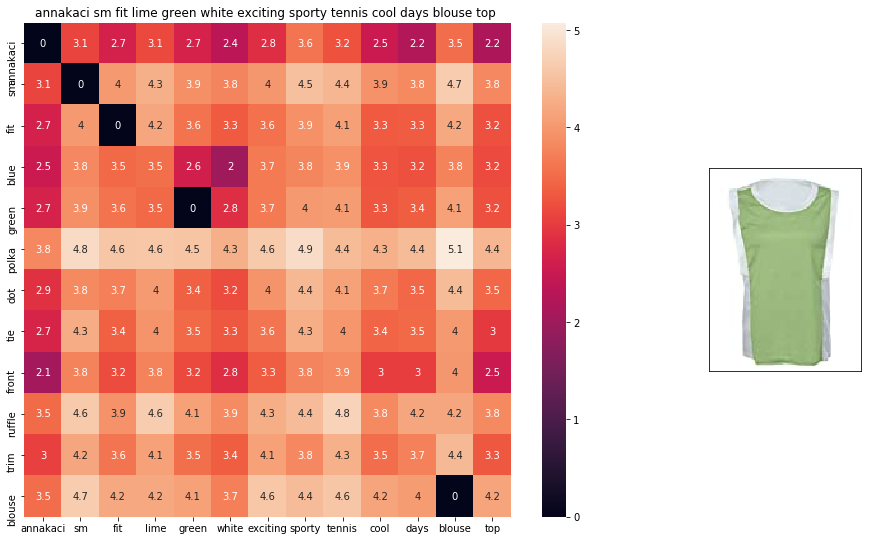

ASIN: B007Y9SZSY
Brand: Anna-Kaci
Title: annakaci sm fit lime green white exciting sporty tennis cool days blouse top 
Euclidean Similarity With The Query Image: 0.84324485
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


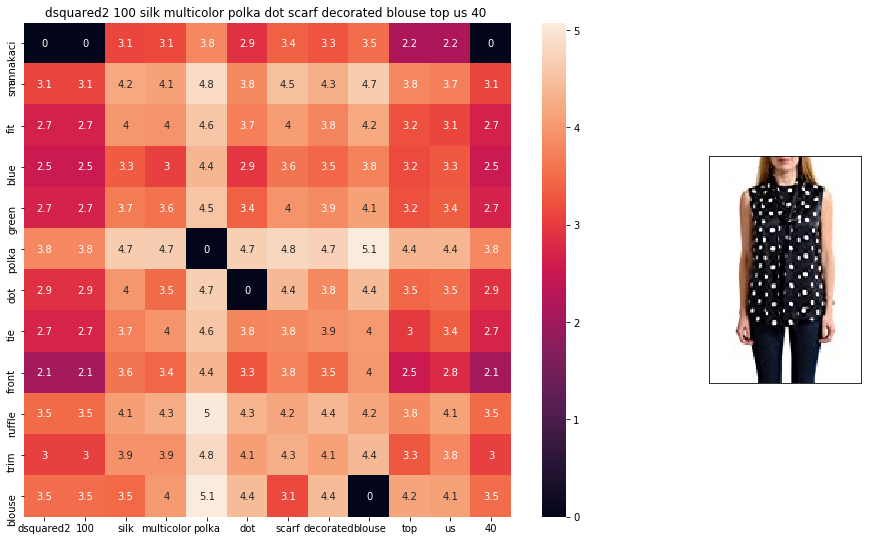

ASIN: B01D6FVFH2
Brand: DSQUARED2
Title: dsquared2 100 silk multicolor polka dot scarf decorated blouse top us 40 
Euclidean Similarity With The Query Image: 0.8452495
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


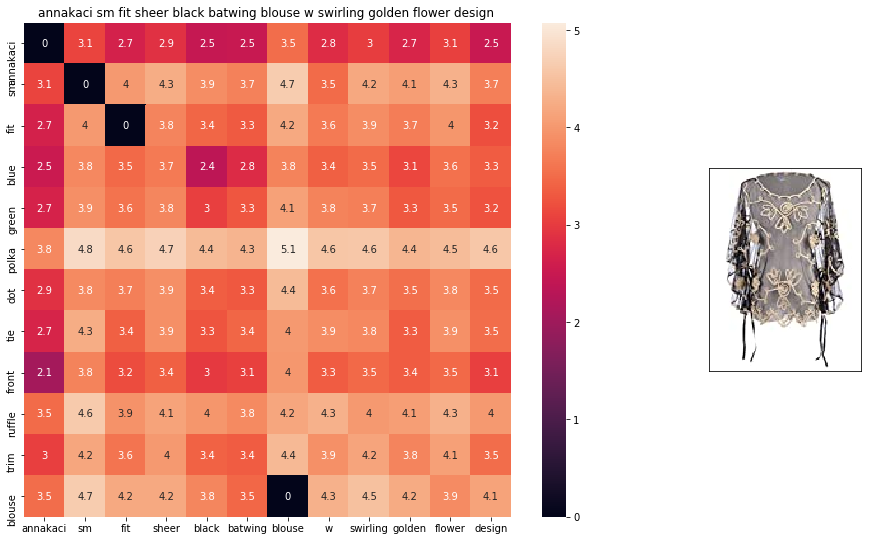

ASIN: B008LE9GA2
Brand: Anna-Kaci
Title: annakaci sm fit sheer black batwing blouse w swirling golden flower design 
Euclidean Similarity With The Query Image: 0.84813696
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


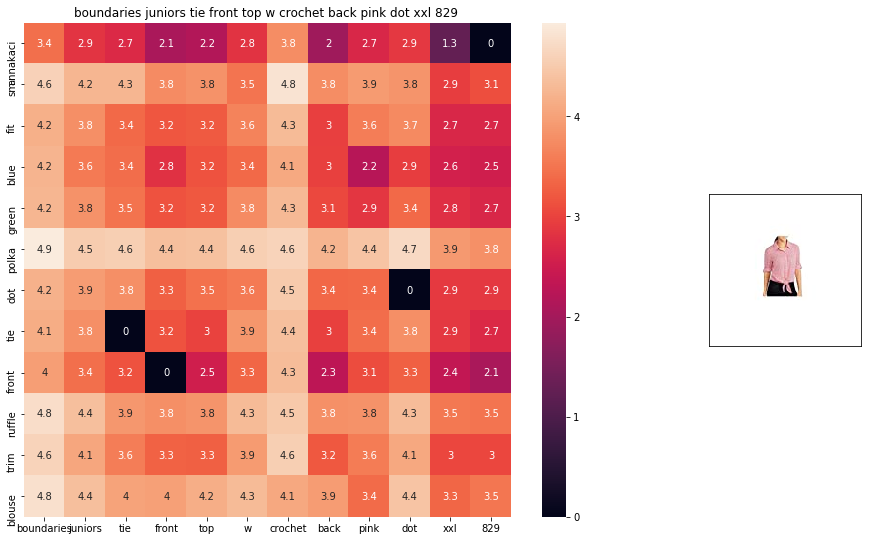

ASIN: B01JCZWOUW
Brand: No Boundaries
Title: boundaries juniors tie front top w crochet back pink dot xxl 829 
Euclidean Similarity With The Query Image: 0.8488442
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


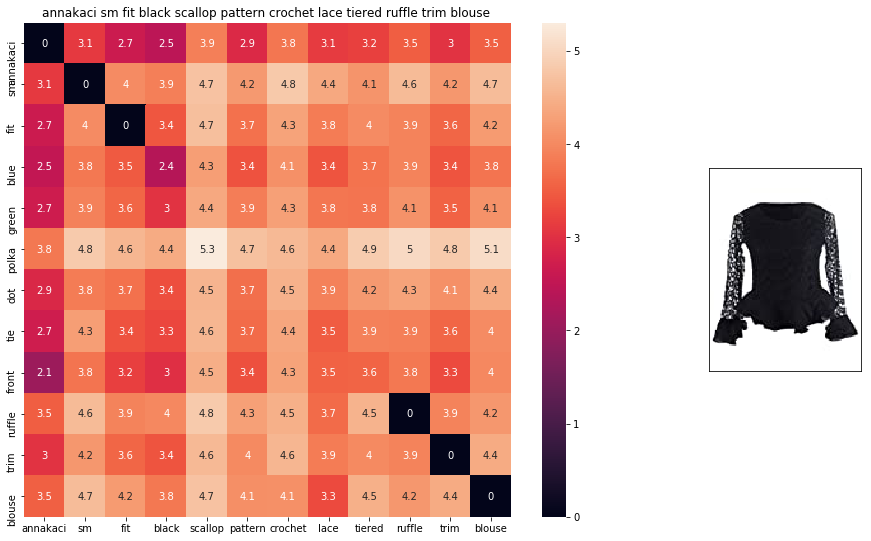

ASIN: B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean Similarity With The Query Image: 0.8498151
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [69]:
avg_w2v_model(931, 20)
#in the give heat map, each cell contains the euclidean distance between words i, j

<p style="font-size:15px"><b><font color=Crimson>2. IDF Weighted Word2Vec Based Product Similarity</font></b></p>

In [70]:
doc_id = 0
w2v_title_weight = []
#for every title we build a weighted vector representation
for i in apparel_data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
#w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

In [72]:
def weighted_w2v_model(doc_id, num_results):
    #doc_id: apparel's id in given corpus
    #pairwise_dist will store the distance from given input apparel to all remaining apparels
    #the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    
    #ref: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    #np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(apparel_data['title'].loc[df_indices[0]],apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:',apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Distance From The Query Image:', pdists[i])
        print('-.'*60)

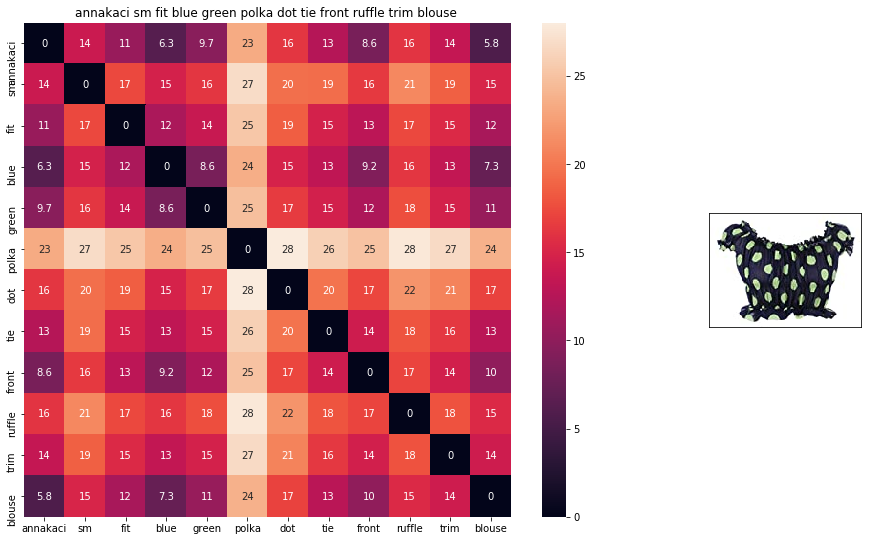

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Distance From The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


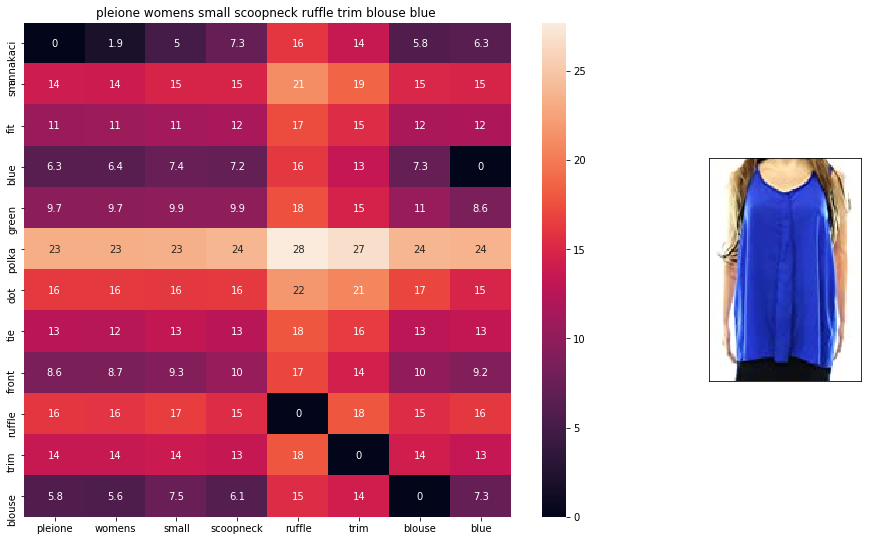

ASIN: B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean Distance From The Query Image: 3.3046243
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


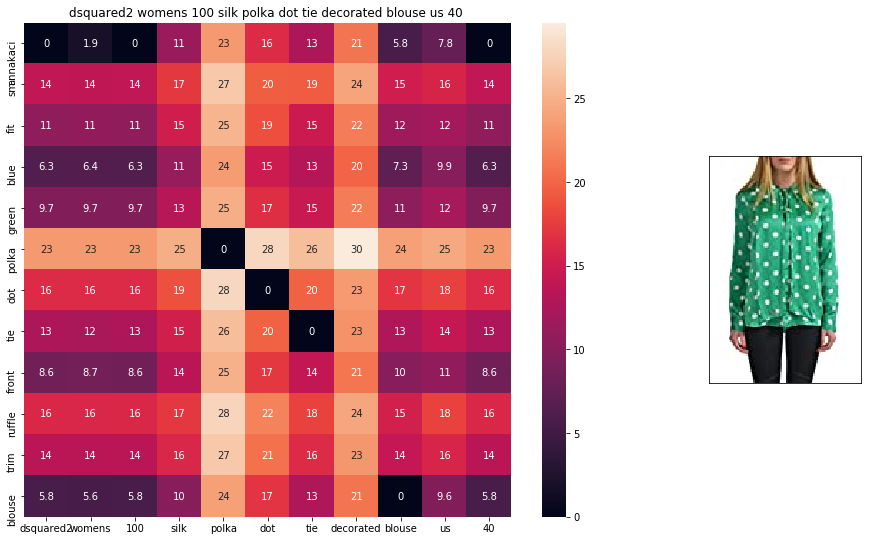

ASIN: B01AYBH28M
Brand: DSQUARED2
Title: dsquared2 womens 100 silk polka dot tie decorated blouse us 40 
Euclidean Distance From The Query Image: 3.3703346
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


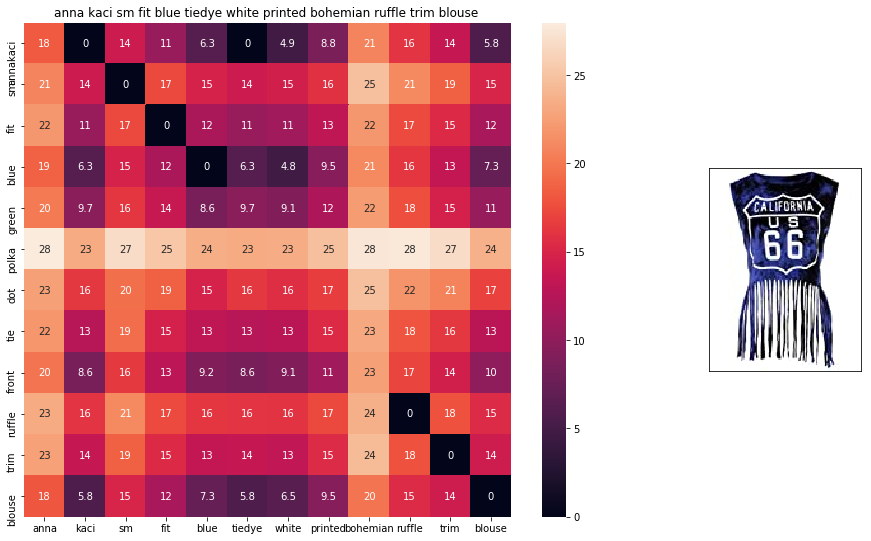

ASIN: B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Distance From The Query Image: 3.4193525
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


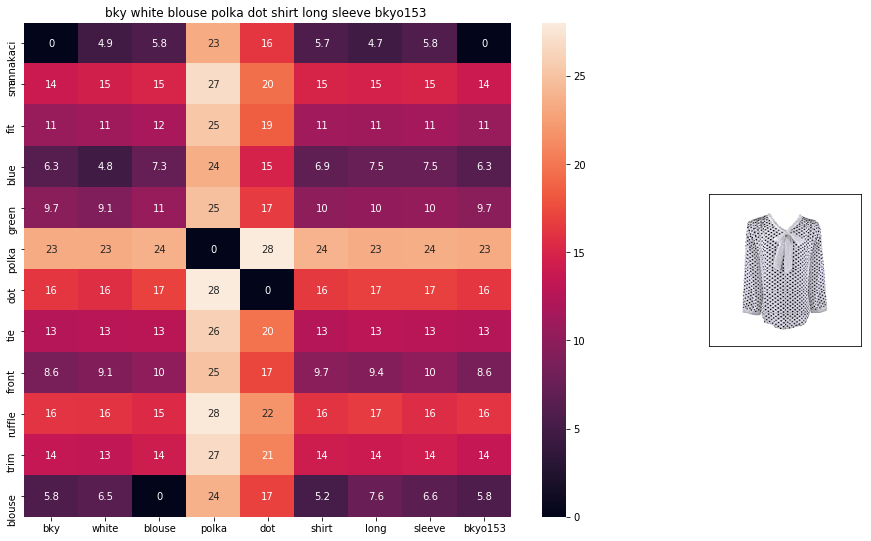

ASIN: B00ZD1LI16
Brand: bankhunyabangyai store
Title: bky white blouse polka dot shirt long sleeve bkyo153 
Euclidean Distance From The Query Image: 3.4255989
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


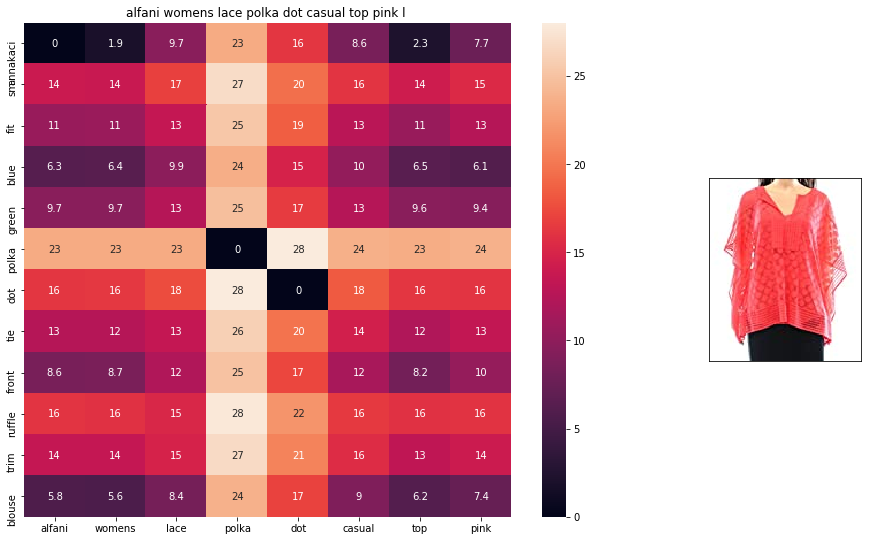

ASIN: B07125NJJ2
Brand: Alfani
Title: alfani womens lace polka dot casual top pink l 
Euclidean Distance From The Query Image: 3.4406197
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


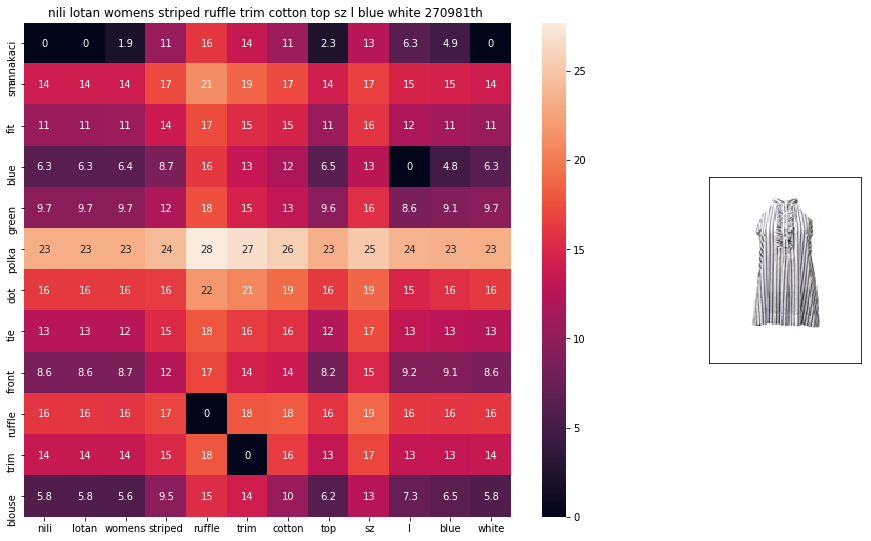

ASIN: B074PFR9CF
Brand: Nili Lotan
Title: nili lotan womens striped ruffle trim cotton top sz l blue white 270981th 
Euclidean Distance From The Query Image: 3.5470216
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


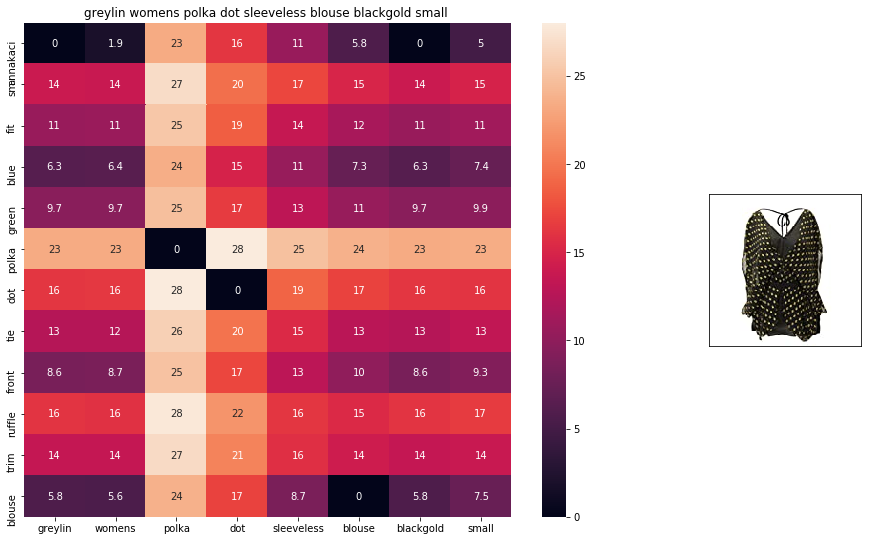

ASIN: B0725BZ69R
Brand: Greylin
Title: greylin womens polka dot sleeveless blouse blackgold small 
Euclidean Distance From The Query Image: 3.570146
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


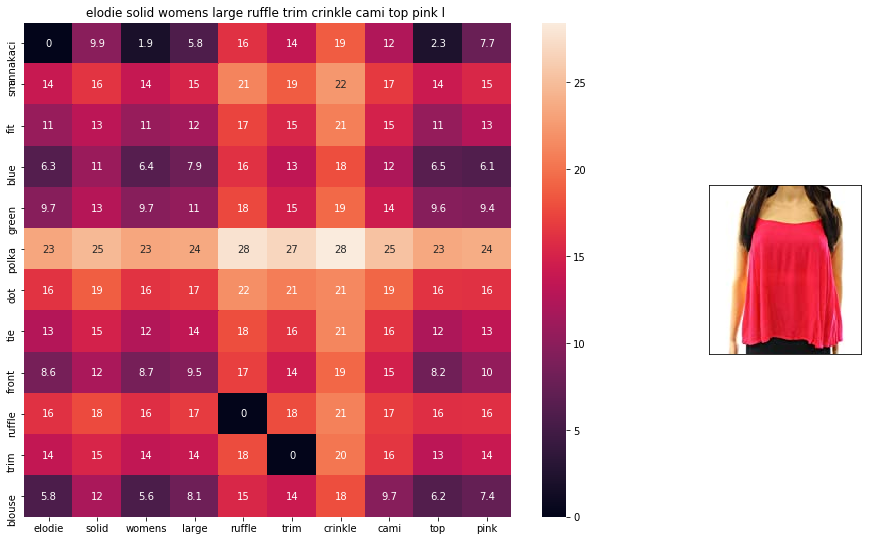

ASIN: B071XHZ2N2
Brand: Elodie
Title: elodie solid womens large ruffle trim crinkle cami top pink l 
Euclidean Distance From The Query Image: 3.6468346
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


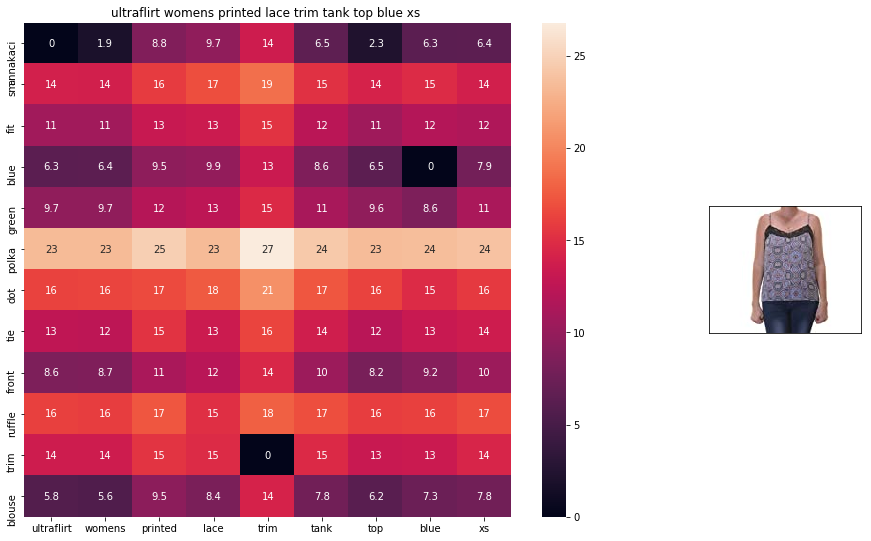

ASIN: B014JS4NIS
Brand: Ultra Flirt
Title: ultraflirt womens printed lace trim tank top blue xs 
Euclidean Distance From The Query Image: 3.6527064
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


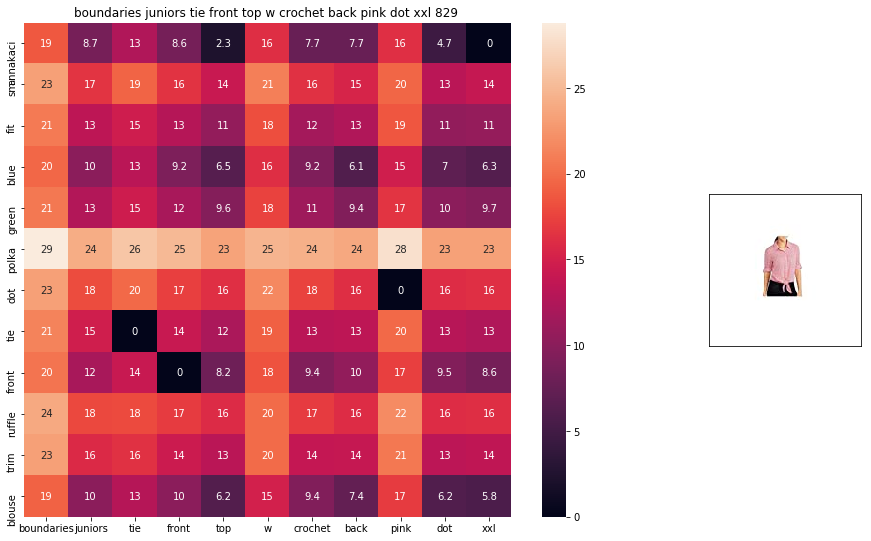

ASIN: B01JCZWOUW
Brand: No Boundaries
Title: boundaries juniors tie front top w crochet back pink dot xxl 829 
Euclidean Distance From The Query Image: 3.6577132
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


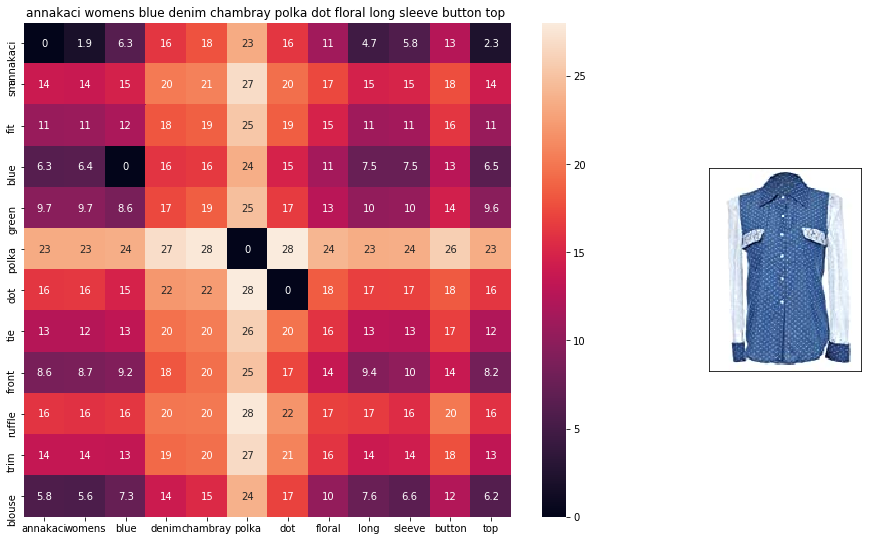

ASIN: B008SMIFN6
Brand: Anna-Kaci
Title: annakaci womens blue denim chambray polka dot floral long sleeve button top 
Euclidean Distance From The Query Image: 3.6822648
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


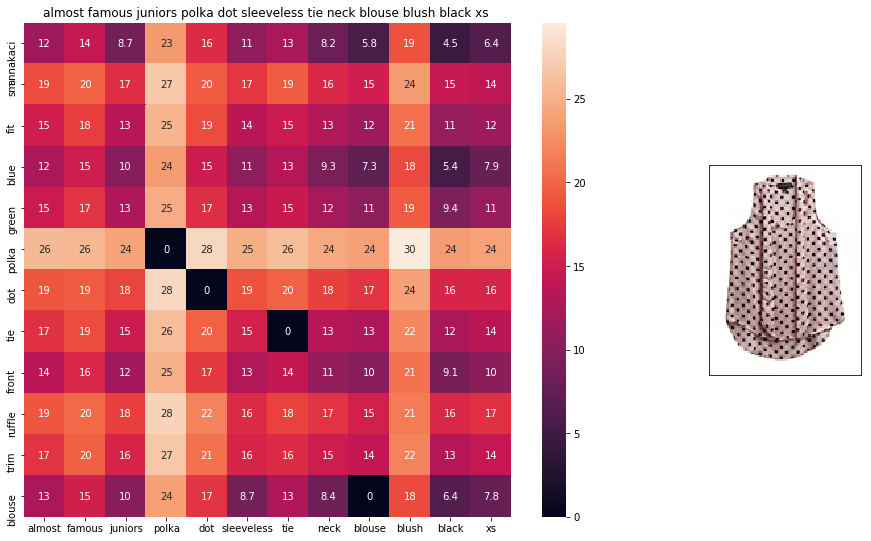

ASIN: B0745J9HNS
Brand: Almost Famous
Title: almost famous juniors polka dot sleeveless tie neck blouse blush black xs 
Euclidean Distance From The Query Image: 3.7160883
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


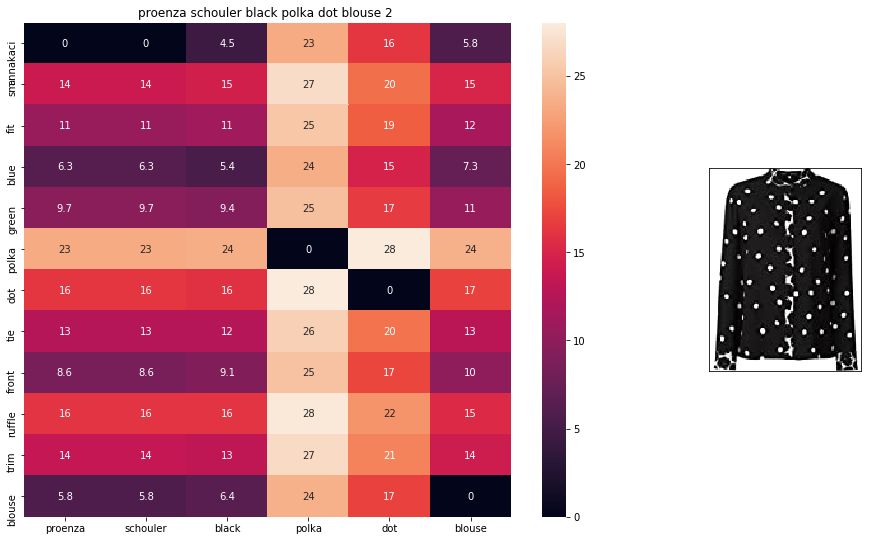

ASIN: B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean Distance From The Query Image: 3.721807
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


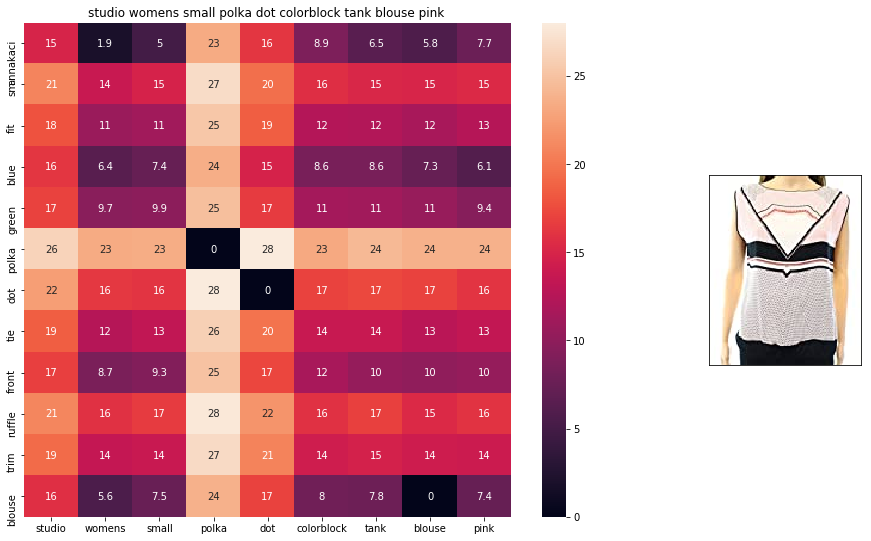

ASIN: B0721KC2HT
Brand: Studio M
Title: studio womens small polka dot colorblock tank blouse pink 
Euclidean Distance From The Query Image: 3.7407618
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


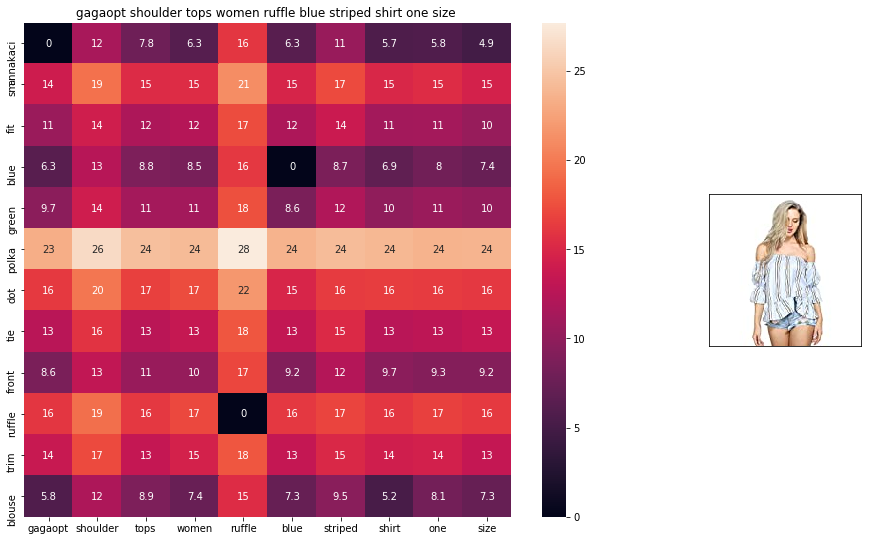

ASIN: B0731KJL5J
Brand: gagaopt
Title: gagaopt shoulder tops women ruffle blue striped shirt one size 
Euclidean Distance From The Query Image: 3.7530394
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


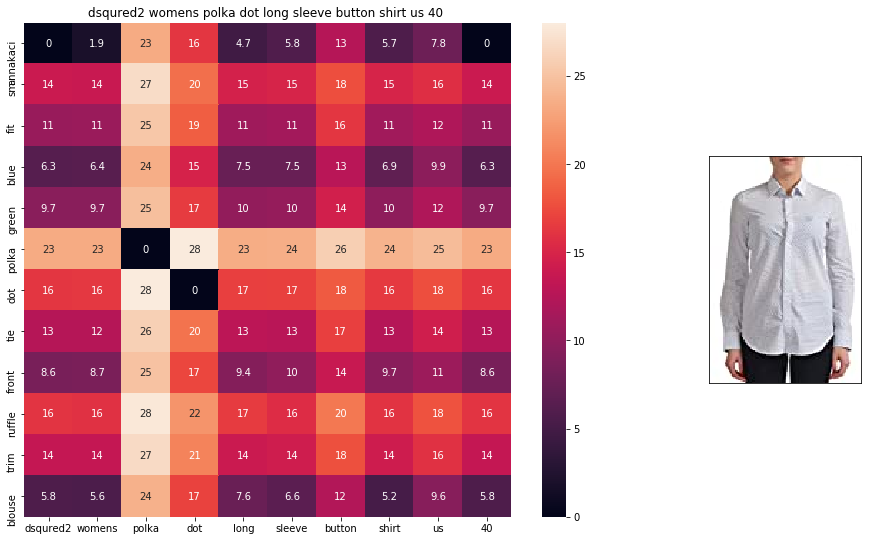

ASIN: B01APYN5AM
Brand: DSQUARED2
Title: dsqured2 womens polka dot long sleeve button shirt us 40 
Euclidean Distance From The Query Image: 3.770843
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


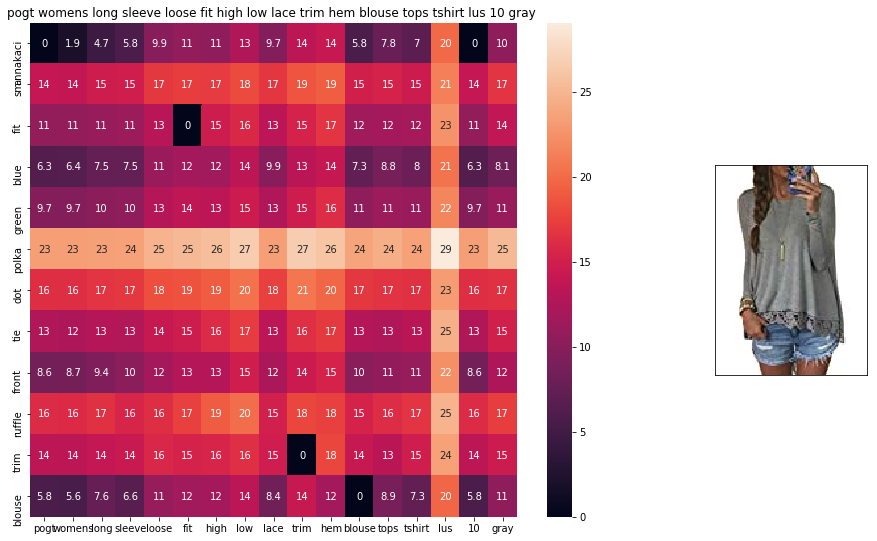

ASIN: B01M19NC0Y
Brand: POGT
Title: pogt womens long sleeve loose fit high low lace trim hem blouse tops tshirt lus 10 gray 
Euclidean Distance From The Query Image: 3.7775102
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


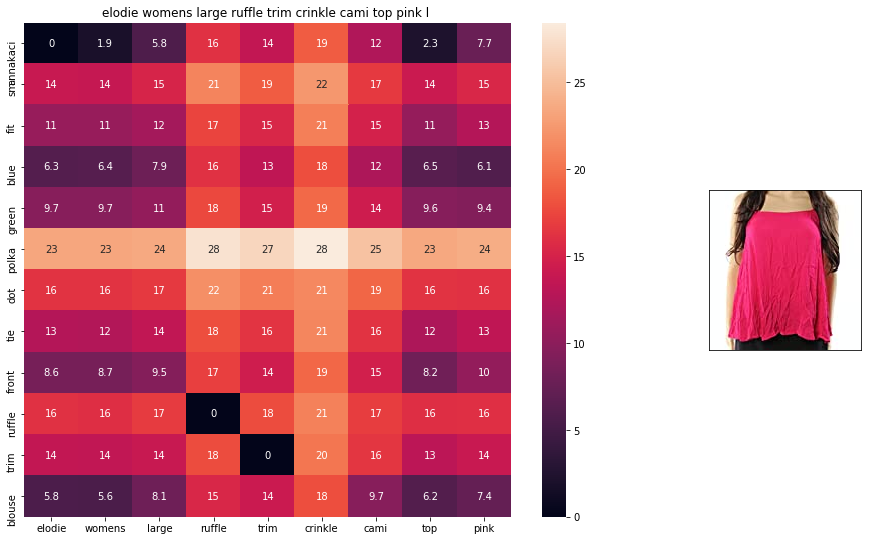

ASIN: B06XD3ZTCB
Brand: Elodie
Title: elodie womens large ruffle trim crinkle cami top pink l 
Euclidean Distance From The Query Image: 3.7784634
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


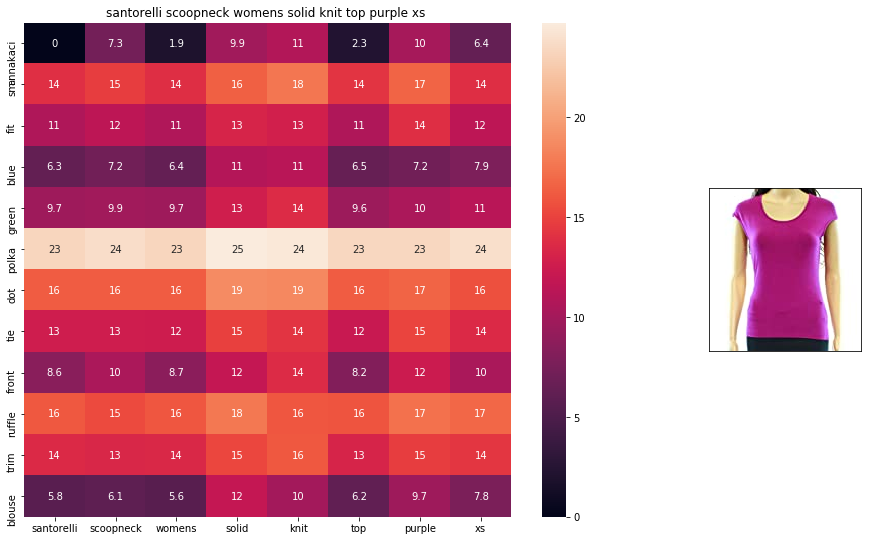

ASIN: B074QW18HZ
Brand: Santorelli
Title: santorelli scoopneck womens solid knit top purple xs 
Euclidean Distance From The Query Image: 3.7946742
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [75]:
weighted_w2v_model(931, 20)
#in the give heat map, each cell contains the euclidean distance between words i, j

<p style="font-size:22px;text-align:center"><b><font color=Turquoise>Weighted Similarity Using Brand & Color</font></b></p>

<p style="font-size:15px">
- Till now, we have been mostly used **Titles** for product similarity. In addition to title, we also have other variables/parameters like **Brand** and **Color**. Here we are going to use **Brand** and **Color** as additional variables.
<br><br>
- For each product we have its **Titles** and we created a title vector in previous stage.<br>
- Now, for each product it has **Brand** and **Color**, for this brand and color we will try to construct the seperate brand and color vectors using **One-Hot-Encoding** technique.<br>
- Once we construct all these three vectors, we can concatenate these three vectors.
</p>

In [77]:
from scipy.sparse import hstack
#some of the brand values are empty. 
#need to replace Null with string "NULL"
apparel_data['brand'].fillna(value="Not Given", inplace=True)

#replace spaces with hypen
brands = [x.replace(" ", "-") for x in apparel_data['brand'].values]
types = [x.replace(" ", "-") for x in apparel_data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in apparel_data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [83]:
import plotly
import plotly.figure_factory as ff

def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    #sentance1 : title1, input apparel
    #sentance2 : title2, recommended apparel
    #url: apparel image url
    #doc_id1: document id of input apparel
    #doc_id2: document id of recommended apparel
    #df_id1: index of document1 in the data frame
    #df_id2: index of document2 in the data frame
    #model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    #s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    #s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [apparel_data['asin'].loc[df_id1], brands[doc_id1], colors[doc_id1], types[doc_id1]], #input apparel's features
               [apparel_data['asin'].loc[df_id2], brands[doc_id2], colors[doc_id2], types[doc_id2]]] #recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] #to color the headings of each column 
    
    #we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    #plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    #devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    #in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    #ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    #set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    #set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    #set title as recommended apparels title
    ax1.set_title(sentance2)

    #in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    #we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    #pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

<p style="font-size:15px">
Let's assume, we want to prefer showing our customers the products of the same brand because probably some of customers are brand conscious OR If we want to pick or showing the products of the same color, then all we have to modify **Euclidean Distance**, simply take **Weighted Euclidean Distance**.<br><br>
For that we have to assign weights to each vectors and simply multiply each of elements from vector with assigned weights, after multiply just take the Euclidean Distance, that is extractly similar to Weighted Euclidean Distance in concept.<br><br>
After doing this, what we get;<br>
**For Eg.**<br>
Weight for Title = 1<br>
Weight for Brand = 5<br>
Weight for Color = 1<br><br>
In this case, since the weight for Brand is more, then we end up preferring products of same brand.<br>
We can easily give our preference for same brand or color by just changing weight
</p>

In [84]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    #doc_id: apparel's id in given corpus
    #w1: weight for w2v features
    #w2: weight for brand and color features
    #pairwise_dist will store the distance from given input apparel to all remaining apparels
    #the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    
    #ref: http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    #np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(apparel_data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v_brand(apparel_data['title'].loc[df_indices[0]], apparel_data['title'].loc[df_indices[i]], apparel_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], df_indices[0], df_indices[i], 'weighted')
        print('ASIN:',apparel_data['asin'].loc[df_indices[i]])
        print('Brand:',apparel_data['brand'].loc[df_indices[i]])
        print('Title:', apparel_data['title'].loc[df_indices[i]])
        print('Euclidean Distance From The Query Image:', pdists[i])
        print('-.'*60)

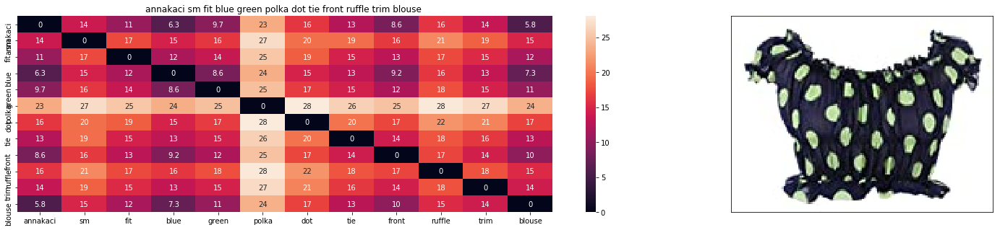

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Distance From The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


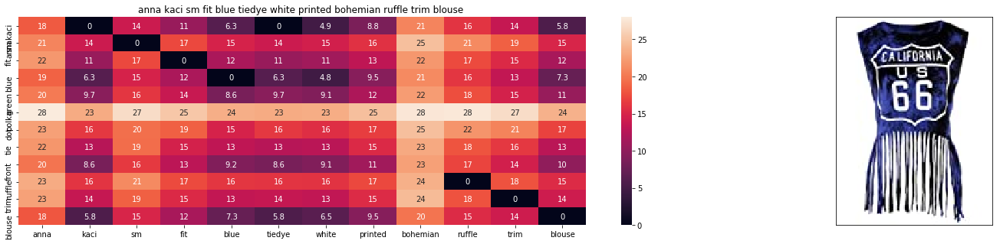

ASIN: B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Distance From The Query Image: 2.2096763610839845
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


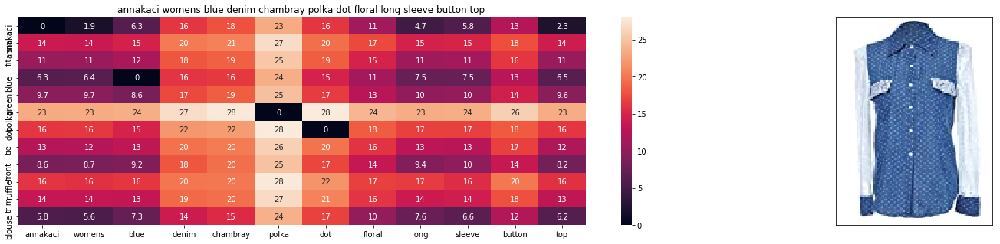

ASIN: B008SMIFN6
Brand: Anna-Kaci
Title: annakaci womens blue denim chambray polka dot floral long sleeve button top 
Euclidean Distance From The Query Image: 2.3411323547363283
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


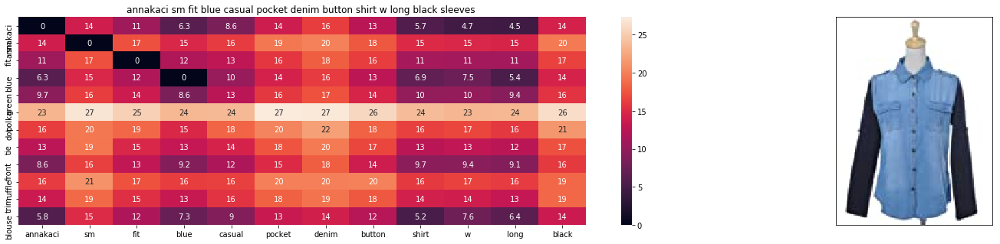

ASIN: B0097LQOOY
Brand: Anna-Kaci
Title: annakaci sm fit blue casual pocket denim button shirt w long black sleeves 
Euclidean Distance From The Query Image: 2.5235042572021484
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


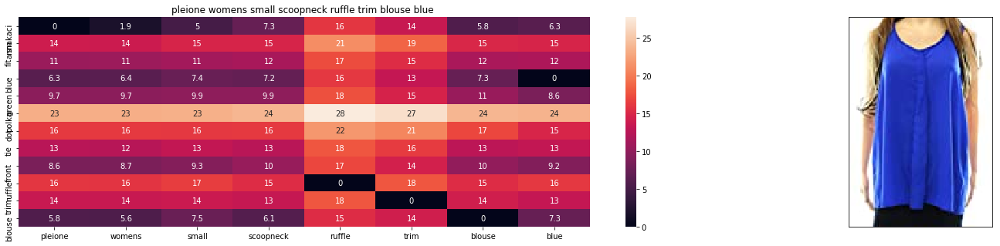

ASIN: B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean Distance From The Query Image: 2.652312088012695
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


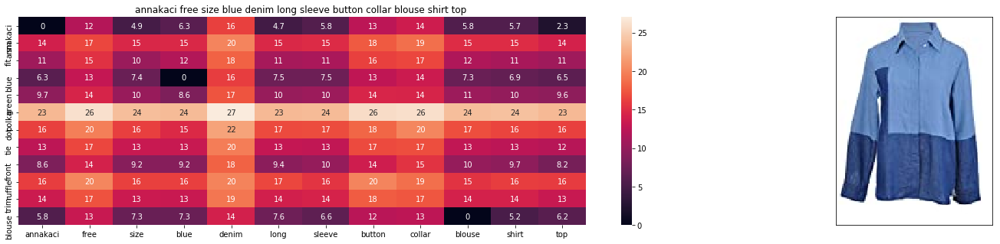

ASIN: B00726I25U
Brand: Anna-Kaci
Title: annakaci free size blue denim long sleeve button collar blouse shirt top 
Euclidean Distance From The Query Image: 2.6782474517822266
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


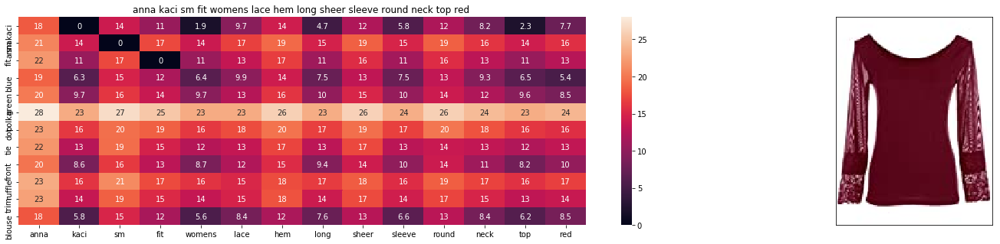

ASIN: B019XS6OLS
Brand: Anna-Kaci
Title: anna kaci sm fit womens lace hem long sheer sleeve round neck top red 
Euclidean Distance From The Query Image: 2.767575124548599
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


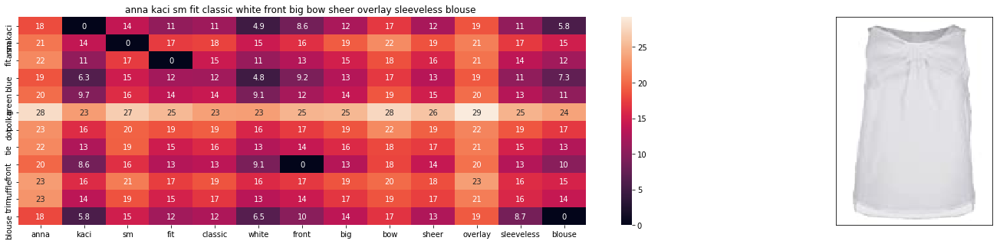

ASIN: B010EH3S02
Brand: Anna-Kaci
Title: anna kaci sm fit classic white front big bow sheer overlay sleeveless blouse 
Euclidean Distance From The Query Image: 2.814418462561294
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


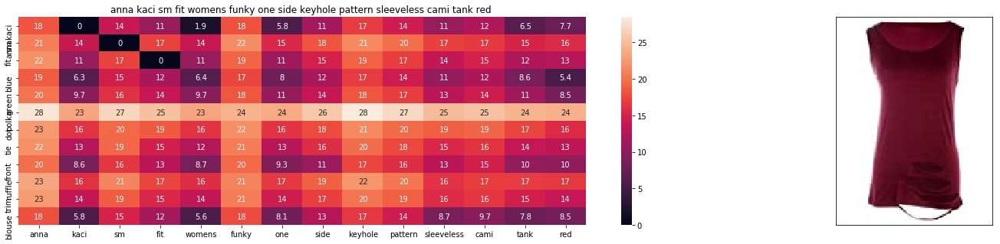

ASIN: B019NQLRF8
Brand: Anna-Kaci
Title: anna kaci sm fit womens funky one side keyhole pattern sleeveless cami tank red 
Euclidean Distance From The Query Image: 2.8479427850710595
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


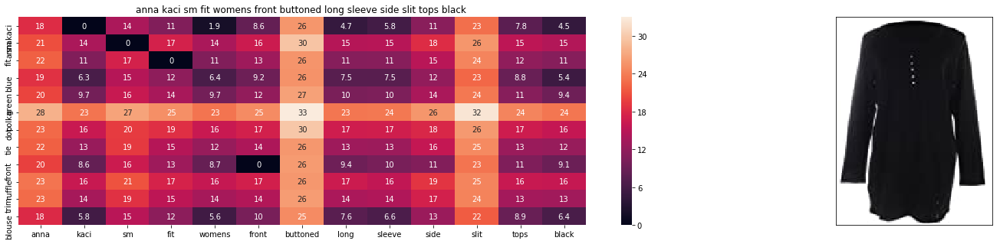

ASIN: B019820A4Q
Brand: Anna-Kaci
Title: anna kaci sm fit womens front buttoned long sleeve side slit tops black 
Euclidean Distance From The Query Image: 2.873210386084243
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


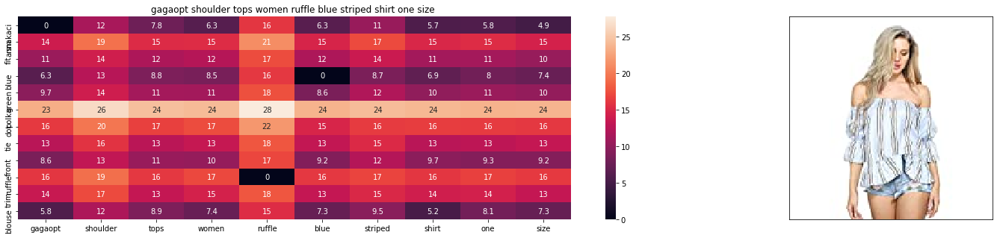

ASIN: B0731KJL5J
Brand: gagaopt
Title: gagaopt shoulder tops women ruffle blue striped shirt one size 
Euclidean Distance From The Query Image: 2.876519775390625
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


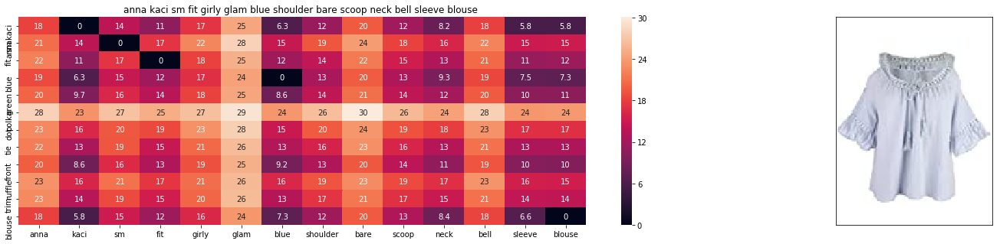

ASIN: B0128Z19IQ
Brand: Anna-Kaci
Title: anna kaci sm fit girly glam blue shoulder bare scoop neck bell sleeve blouse 
Euclidean Distance From The Query Image: 2.877251625061035
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


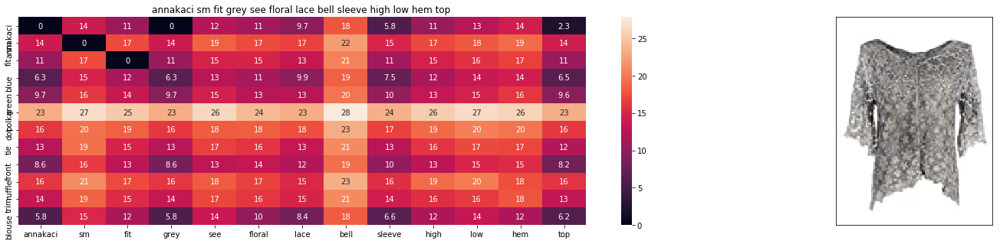

ASIN: B00NAEMMW2
Brand: Anna-Kaci
Title: annakaci sm fit grey see floral lace bell sleeve high low hem top 
Euclidean Distance From The Query Image: 2.8801903284060204
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


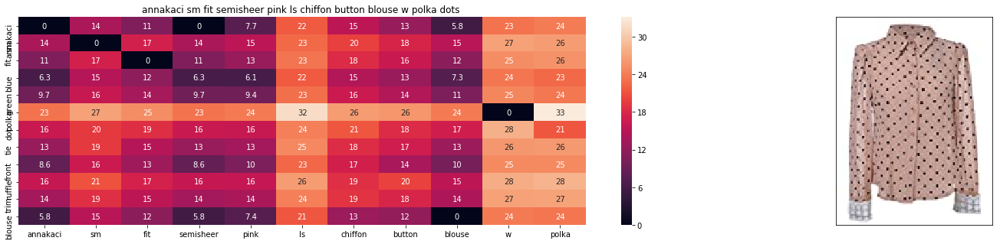

ASIN: B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean Distance From The Query Image: 2.8918119943606104
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


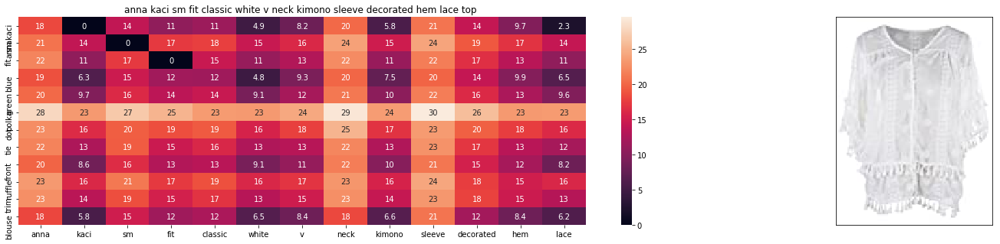

ASIN: B011WFBMBC
Brand: Anna-Kaci
Title: anna kaci sm fit classic white v neck kimono sleeve decorated hem lace top 
Euclidean Distance From The Query Image: 2.9190594232546534
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


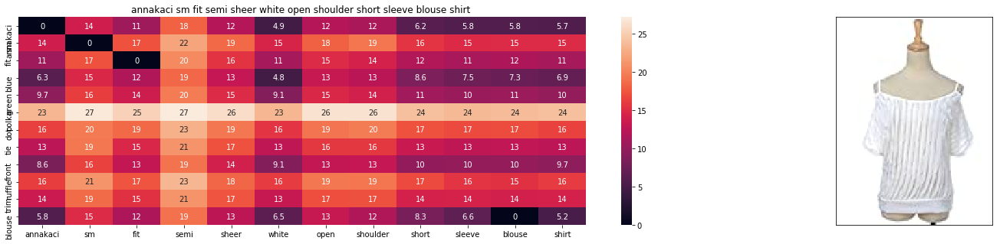

ASIN: B007HCB8XM
Brand: Anna-Kaci
Title: annakaci sm fit semi sheer white open shoulder short sleeve blouse shirt 
Euclidean Distance From The Query Image: 2.923176435278579
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


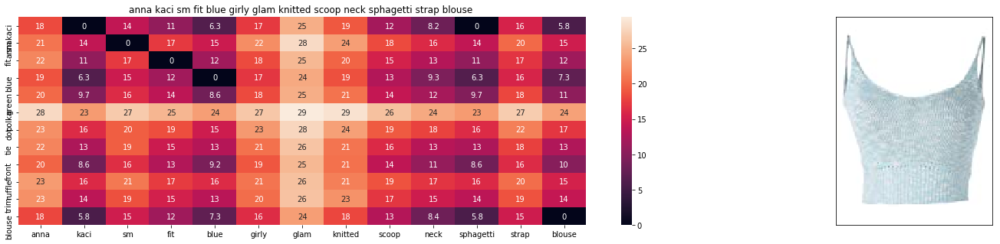

ASIN: B010EH1PCK
Brand: Anna-Kaci
Title: anna kaci sm fit blue girly glam knitted scoop neck sphagetti strap blouse 
Euclidean Distance From The Query Image: 2.92809944152832
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


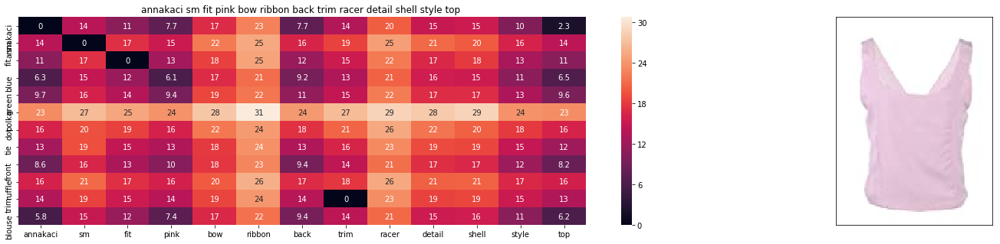

ASIN: B00KOBQEBO
Brand: Anna-Kaci
Title: annakaci sm fit pink bow ribbon back trim racer detail shell style top 
Euclidean Distance From The Query Image: 2.9400480783449856
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


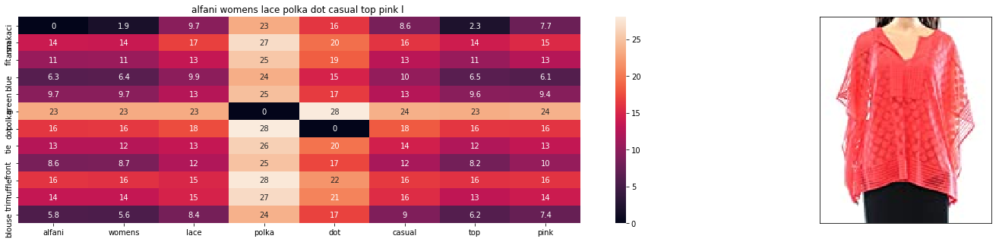

ASIN: B07125NJJ2
Brand: Alfani
Title: alfani womens lace polka dot casual top pink l 
Euclidean Distance From The Query Image: 2.945054701103503
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


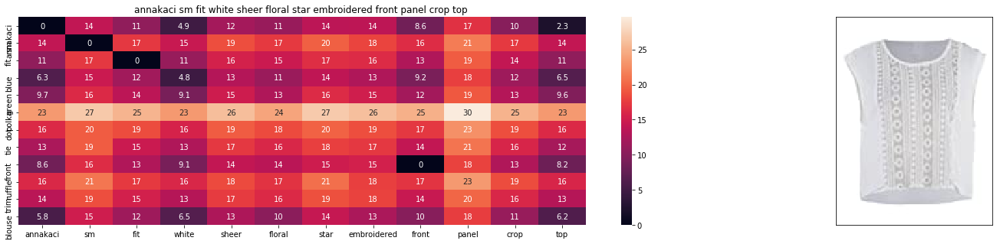

ASIN: B00NAB1R8A
Brand: Anna-Kaci
Title: annakaci sm fit white sheer floral star embroidered front panel crop top 
Euclidean Distance From The Query Image: 2.9476131952273095
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [90]:
#w1 - title vector weight = 5
#w2 - brand and color weight = 5

idf_w2v_brand(931, 5, 5, 20)
#in the give heat map, each cell contains the euclidean distance between words i, j

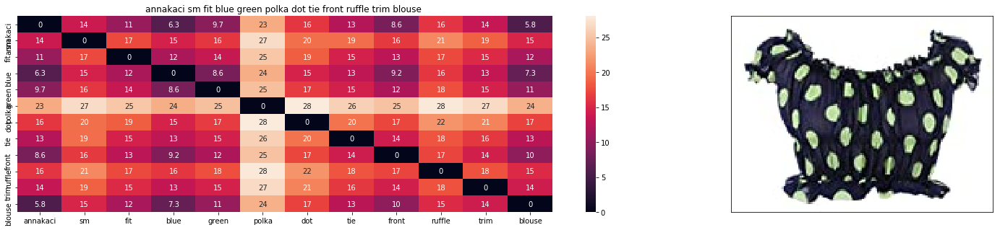

ASIN: B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Distance From The Query Image: 0.0
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


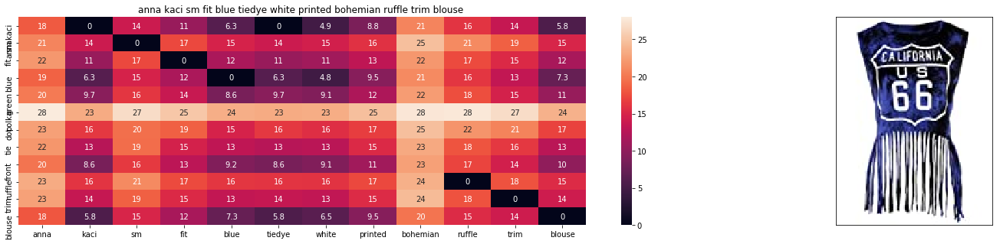

ASIN: B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean Distance From The Query Image: 1.2199411565607243
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


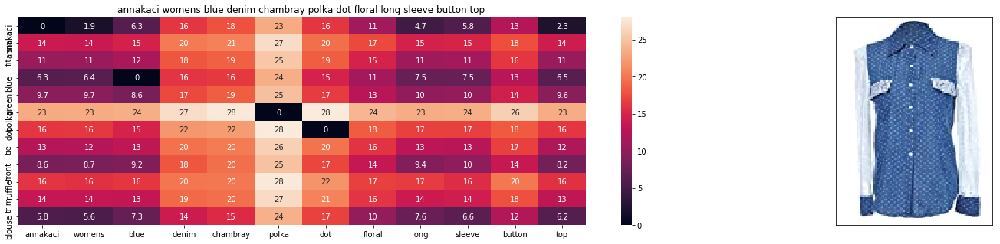

ASIN: B008SMIFN6
Brand: Anna-Kaci
Title: annakaci womens blue denim chambray polka dot floral long sleeve button top 
Euclidean Distance From The Query Image: 1.243842246315696
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


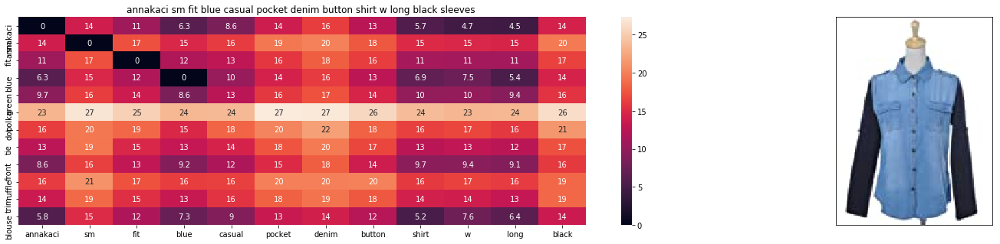

ASIN: B0097LQOOY
Brand: Anna-Kaci
Title: annakaci sm fit blue casual pocket denim button shirt w long black sleeves 
Euclidean Distance From The Query Image: 1.2770007740367542
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


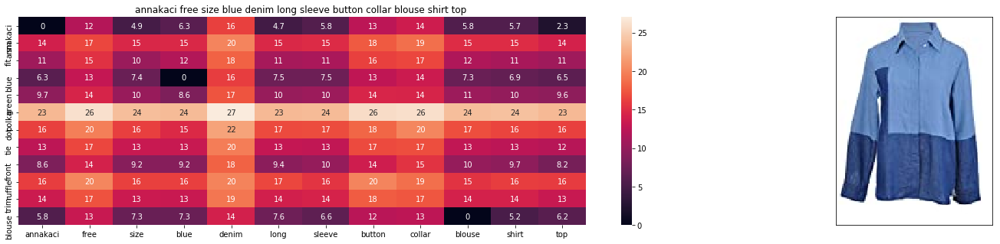

ASIN: B00726I25U
Brand: Anna-Kaci
Title: annakaci free size blue denim long sleeve button collar blouse shirt top 
Euclidean Distance From The Query Image: 1.3051359003240413
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


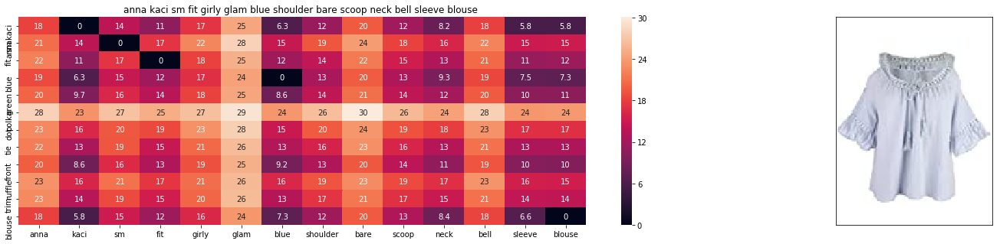

ASIN: B0128Z19IQ
Brand: Anna-Kaci
Title: anna kaci sm fit girly glam blue shoulder bare scoop neck bell sleeve blouse 
Euclidean Distance From The Query Image: 1.3413184772838245
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


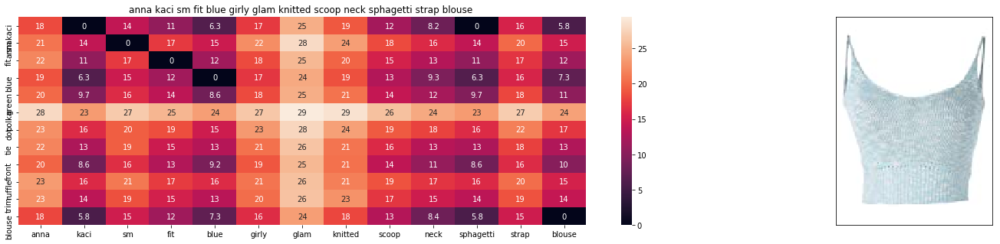

ASIN: B010EH1PCK
Brand: Anna-Kaci
Title: anna kaci sm fit blue girly glam knitted scoop neck sphagetti strap blouse 
Euclidean Distance From The Query Image: 1.350563534823331
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


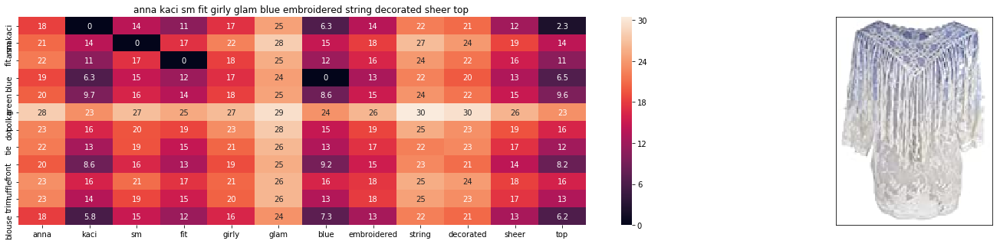

ASIN: B0128Z1BNO
Brand: Anna-Kaci
Title: anna kaci sm fit girly glam blue embroidered string decorated sheer top 
Euclidean Distance From The Query Image: 1.364266690340909
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


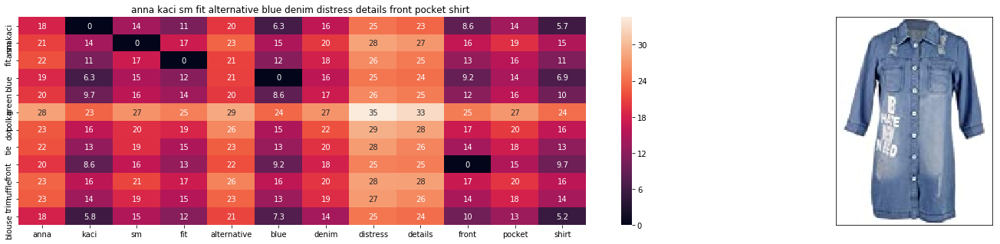

ASIN: B010EH2WCW
Brand: Anna-Kaci
Title: anna kaci sm fit alternative blue denim distress details front pocket shirt 
Euclidean Distance From The Query Image: 1.3654567371715198
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


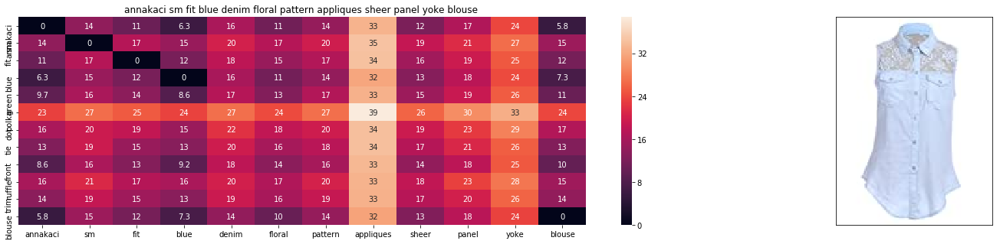

ASIN: B00E7Z8G8M
Brand: Anna-Kaci
Title: annakaci sm fit blue denim floral pattern appliques sheer panel yoke blouse 
Euclidean Distance From The Query Image: 1.4247143138538707
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


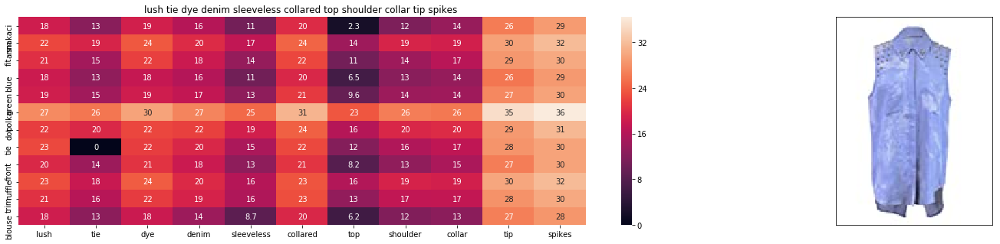

ASIN: B00FH9CBE2
Brand: Anna-Kaci
Title: lush tie dye denim sleeveless collared top shoulder collar tip spikes 
Euclidean Distance From The Query Image: 1.5177067843350498
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


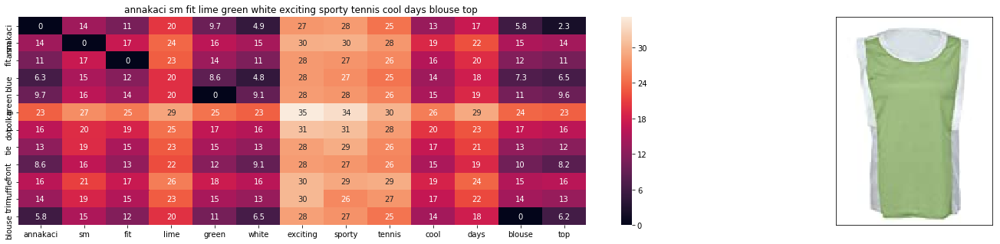

ASIN: B007Y9SZSY
Brand: Anna-Kaci
Title: annakaci sm fit lime green white exciting sporty tennis cool days blouse top 
Euclidean Distance From The Query Image: 1.7635778603804593
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


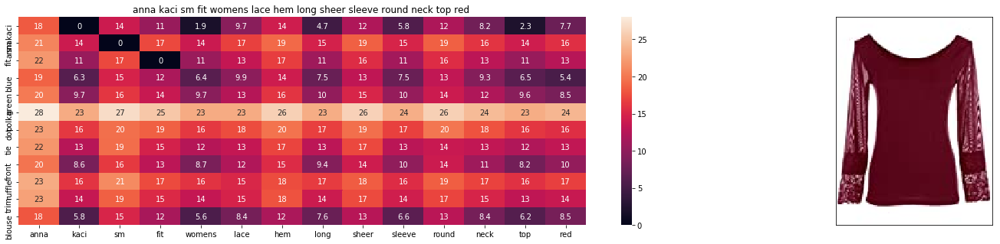

ASIN: B019XS6OLS
Brand: Anna-Kaci
Title: anna kaci sm fit womens lace hem long sheer sleeve round neck top red 
Euclidean Distance From The Query Image: 1.9203279561106448
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


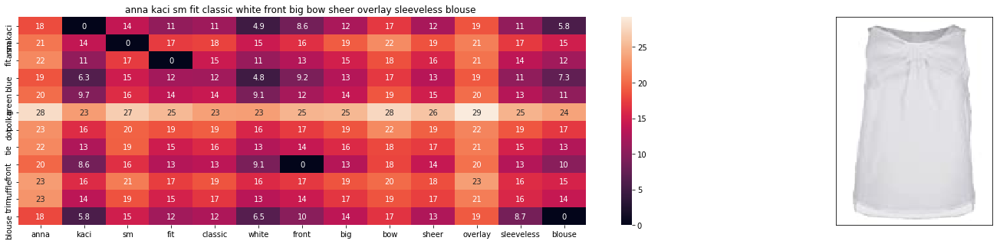

ASIN: B010EH3S02
Brand: Anna-Kaci
Title: anna kaci sm fit classic white front big bow sheer overlay sleeveless blouse 
Euclidean Distance From The Query Image: 1.9288449266584076
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


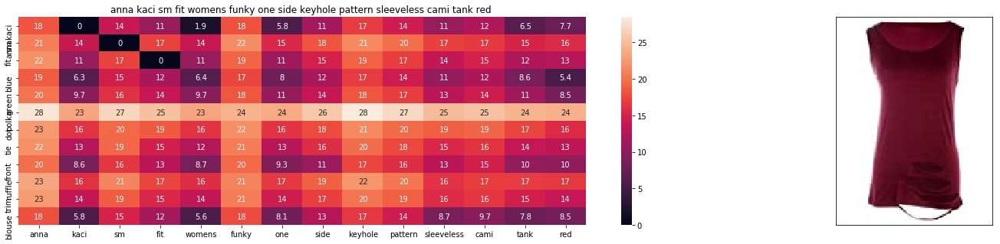

ASIN: B019NQLRF8
Brand: Anna-Kaci
Title: anna kaci sm fit womens funky one side keyhole pattern sleeveless cami tank red 
Euclidean Distance From The Query Image: 1.9349402580238195
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


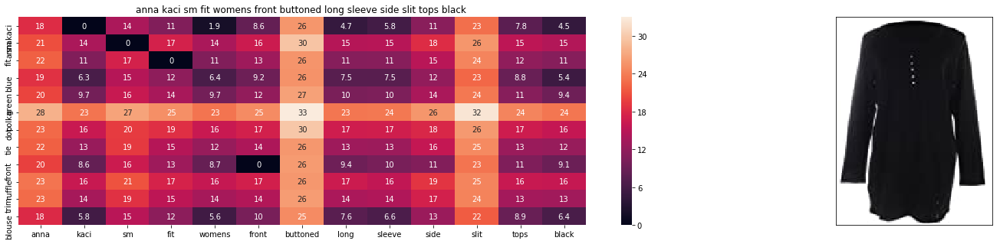

ASIN: B019820A4Q
Brand: Anna-Kaci
Title: anna kaci sm fit womens front buttoned long sleeve side slit tops black 
Euclidean Distance From The Query Image: 1.9395343672989438
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


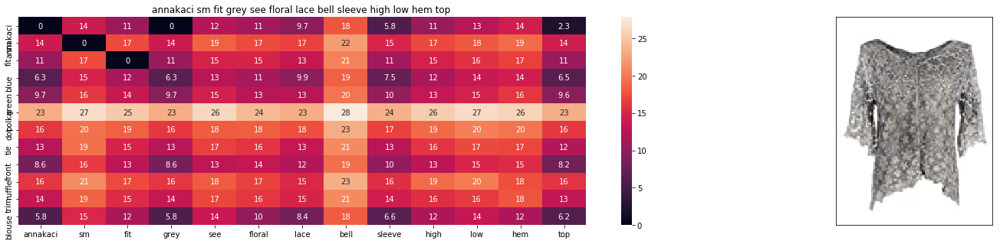

ASIN: B00NAEMMW2
Brand: Anna-Kaci
Title: annakaci sm fit grey see floral lace bell sleeve high low hem top 
Euclidean Distance From The Query Image: 1.9408034477210852
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


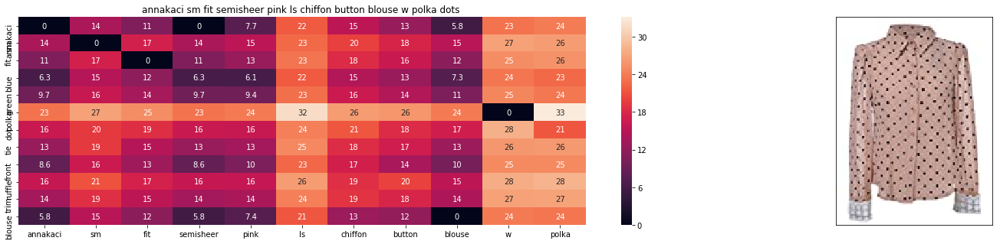

ASIN: B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean Distance From The Query Image: 1.9429164778946468
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


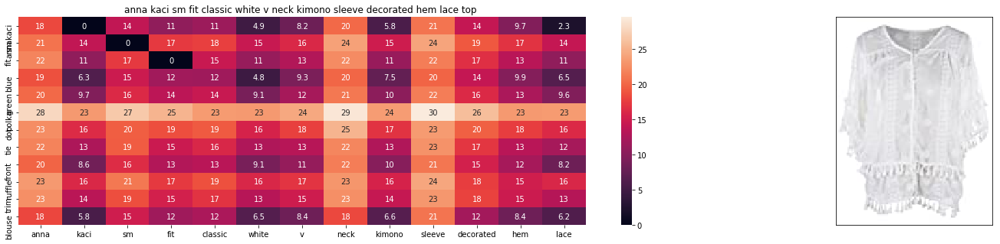

ASIN: B011WFBMBC
Brand: Anna-Kaci
Title: anna kaci sm fit classic white v neck kimono sleeve decorated hem lace top 
Euclidean Distance From The Query Image: 1.947870555875382
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


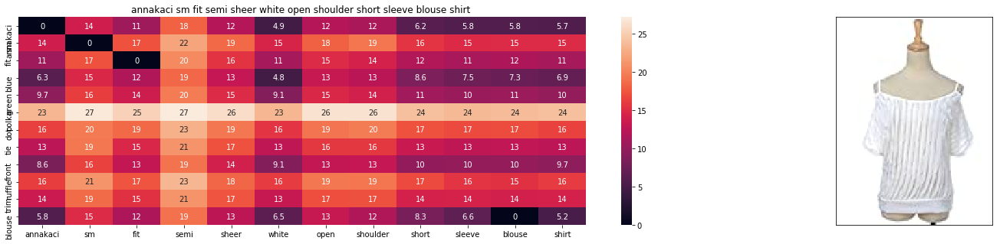

ASIN: B007HCB8XM
Brand: Anna-Kaci
Title: annakaci sm fit semi sheer white open shoulder short sleeve blouse shirt 
Euclidean Distance From The Query Image: 1.9486191035160958
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.


In [91]:
#w1 - title vector weight = 5
#w2 - brand and color weight = 50

idf_w2v_brand(931, 5, 50, 20)
#in the give heat map, each cell contains the euclidean distance between words i, j

<p style="font-size:20px;text-align:center"><b><font color=DarkSlateGray>For Deep Learning Based Visual Product Similarity - Refer <font color=DeepPink><a href="https://gitlab.com/akashbangalkar/amazon-apparel-recommendations-system/-/blob/main/3._Amazon_Apparel_Recommendations.ipynb">Part 3</a></font> Notebook</font></b></p>